# **Unidad 5: Machine Learning en Series Temporales**

In [4]:
# Se instalan las librerías
!pip install h2o
!pip install neuralprophet
!pip install pandas-profiling==2.7.1
!pip install autoviz
!pip install seaborn
!pip install sweetviz
!pip install tsfresh
!pip install pmdarima
!pip install darts
!pip install neuralprophet

     |████████████████████████████████| 164.8 MB 4.0 kB/s 
  Created wheel for h2o: filename=h2o-3.32.1.5-py2.py3-none-any.whl size=164886106 sha256=f19c2d3a0a4ba1a8e4172c3b023b23cf6fa2195c2a9f4f52352e451c0fac7ea7
  Stored in directory: /root/.cache/pip/wheels/2f/f4/f6/7115a720596f0b6c377b3d82c28242585c7bb7ab27d430f97c
Successfully built h2o
     |████████████████████████████████| 56 kB 3.4 MB/s 
     |████████████████████████████████| 748.8 MB 17 kB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.10.0+cu102 requires torch==1.9.0, but you have torch 1.6.0 which is incompatible.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.6.0 which is incompatible.
     |███████████

     |████████████████████████████████| 1.5 MB 7.4 MB/s 
     |████████████████████████████████| 9.5 MB 17.7 MB/s 
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2
     |████████████████████████████████| 235 kB 6.5 MB/s 
     |████████████████████████████████| 62 kB 937 kB/s 
     |████████████████████████████████| 10.3 MB 45.3 MB/s 
     |████████████████████████████████| 786 kB 47.8 MB/s 
     |████████████████████████████████| 804.1 MB 2.6 kB/s 
     |████████████████████████████████| 22.3 MB 56.4 MB/s 
     |████████████████████████████████| 65 kB 5.7 MB/s 
     |████████████████████████████████| 9.9 MB 16.3 MB/s 
     |████████████████████████████████| 177 kB 86.8 MB/s 
     |████████████████████████████████| 142 kB 75.3 MB/s 
     |████████████████████████████████| 368 kB 58.2 MB/s 
     |████████████████████████████████| 49 kB 7.9 MB/s 
     |████████████

  Using cached torch-1.6.0-cp37-cp37m-manylinux1_x86_64.whl (748.8 MB)
  Attempting uninstall: torch
    Found existing installation: torch 1.8.1
    Uninstalling torch-1.8.1:
      Successfully uninstalled torch-1.8.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchvision 0.10.0+cu102 requires torch==1.9.0, but you have torch 1.6.0 which is incompatible.
torchtext 0.10.0 requires torch==1.9.0, but you have torch 1.6.0 which is incompatible.
darts 0.10.0 requires torch<1.9.0,>=1.8.0, but you have torch 1.6.0 which is incompatible.


In [2]:
# Se cargan las librerías
from pandas import DataFrame
from pandas import concat
import random
from scipy import stats
import numpy as np
import pandas as pd
from math import sqrt
from numpy import concatenate
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from pandas import DataFrame
from pandas import concat
import seaborn as sn
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import h2o
from h2o.automl import H2OAutoML
from pandas_profiling import ProfileReport
import gc
from autoviz.AutoViz_Class import AutoViz_Class
import sweetviz
from neuralprophet import NeuralProphet
from neuralprophet import set_random_seed 
set_random_seed(0)
from IPython.display import YouTubeVideo
from tsfresh import extract_features
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
from pmdarima.arima import auto_arima
from darts import TimeSeries
import pmdarima as pm
from darts.models import (NaiveSeasonal,NaiveDrift,RNNModel,Prophet,ExponentialSmoothing,ARIMA,AutoARIMA,TCNModel,TransformerModel,Theta,FFT)
%matplotlib inline

Imported AutoViz_Class version: 0.0.83. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


No aplica para este ejemplo pero con esta [librería](https://github.com/8080labs/pyforest), se pueden importar muchas librerías en un línea de código

In [ ]:
!pip install pyforest
from pyforest import *

En este [link](https://github.com/MaxBenChrist/awesome_time_series_in_python) encontrarán librerías útiles para series de tiempo

# Ejemplo Dataset "Contaminación"

[Fuente del Dataset](https://raw.githubusercontent.com/sagarmk/Forecasting-on-Air-pollution-with-RNN-LSTM/master/pollution.csv)

Esta base de datos informa sobre el clima y el nivel de contaminación cada hora durante cinco años en la embajada de Estados Unidos ubicada en Beijing, China.

**Variables:**
*   date: fecha y hora
*   pollution: concentración de PM2.5 (Contaminación)
*   dew: punto de rocío
*   temp: temperatura
*   press: Presión
*   wnd_dir: dirección del viento
*   wnd_spd: velocidad del viento acumulada
*   snow: horas acumuladas de nieve
*   rain: horas acumuladas de lluvia





## **Análisis Exploratorio**





In [3]:
# Se carga la base
df = pd.read_csv('https://raw.githubusercontent.com/sagarmk/Forecasting-on-Air-pollution-with-RNN-LSTM/master/pollution.csv',index_col=0)
# df.to_csv('Dataset') para guardar la base
df.head()

NameError: ignored

In [ ]:
# Análisis exploratorio general
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43800 entries, 2010-01-02 00:00:00 to 2014-12-31 23:00:00
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   pollution  43800 non-null  float64
 1   dew        43800 non-null  int64  
 2   temp       43800 non-null  float64
 3   press      43800 non-null  float64
 4   wnd_dir    43800 non-null  object 
 5   wnd_spd    43800 non-null  float64
 6   snow       43800 non-null  int64  
 7   rain       43800 non-null  int64  
dtypes: float64(4), int64(3), object(1)
memory usage: 3.0+ MB


In [ ]:
# Análisis exploratorio por variable
df.describe()

,pollution,dew,temp,press,wnd_spd,snow,rain
count,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000,43800.000000
mean,94.013516,1.828516,12.459041,1016.447306,23.894307,0.052763,0.195023
std,92.252276,14.429326,12.193384,10.271411,50.022729,0.760582,1.416247
min,0.000000,-40.000000,-19.000000,991.000000,0.450000,0.000000,0.000000
25%,24.000000,-10.000000,2.000000,1008.000000,1.790000,0.000000,0.000000
50%,68.000000,2.000000,14.000000,1016.000000,5.370000,0.000000,0.000000
75%,132.250000,15.000000,23.000000,1025.000000,21.910000,0.000000,0.000000
max,994.000000,28.000000,42.000000,1046.000000,585.600000,27.000000,36.000000


<AxesSubplot:xlabel='date'>

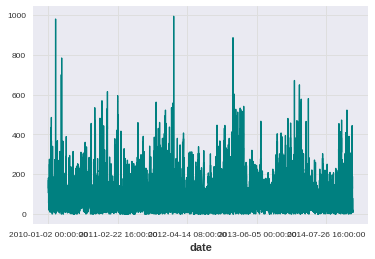

In [ ]:
# Se grafica la contaminación 
df['pollution'].plot(label='Contaminación', color='teal')

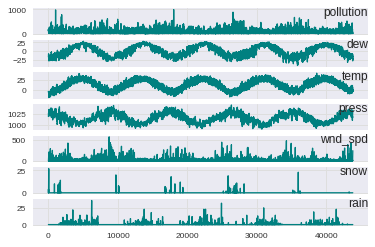

In [ ]:
# Se grafica la evolución de todas las variables
values = df.values
groups = [0, 1, 2, 3, 5, 6, 7]
i = 1
# plot each column
plt.figure()
for group in groups:
    plt.subplot(len(groups), 1, i)
    plt.plot(values[:, group],color='teal')
    plt.title(df.columns[group], y=0.5, loc='right')
    i += 1
plt.show()

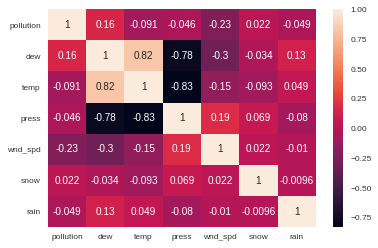

<Figure size 432x288 with 0 Axes>

In [ ]:
# Matriz de correlación
corrMatrix =df.corr()
sn.heatmap(corrMatrix, annot = True, )
plt.figure()
plt.show()

Shape of your Data Set: (43800, 9)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  3
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  1
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    8 Predictors classified...
        This does not include the Target column(s)
        1 variables removed since they were ID or low-information variables

################ Regression VISUALIZATION Started #####################


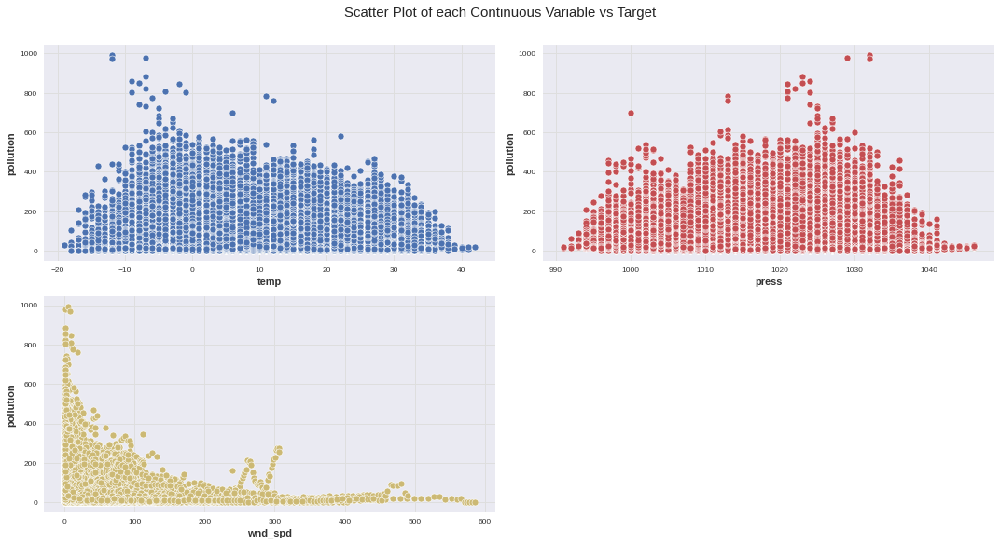

Number of All Scatter Plots = 6


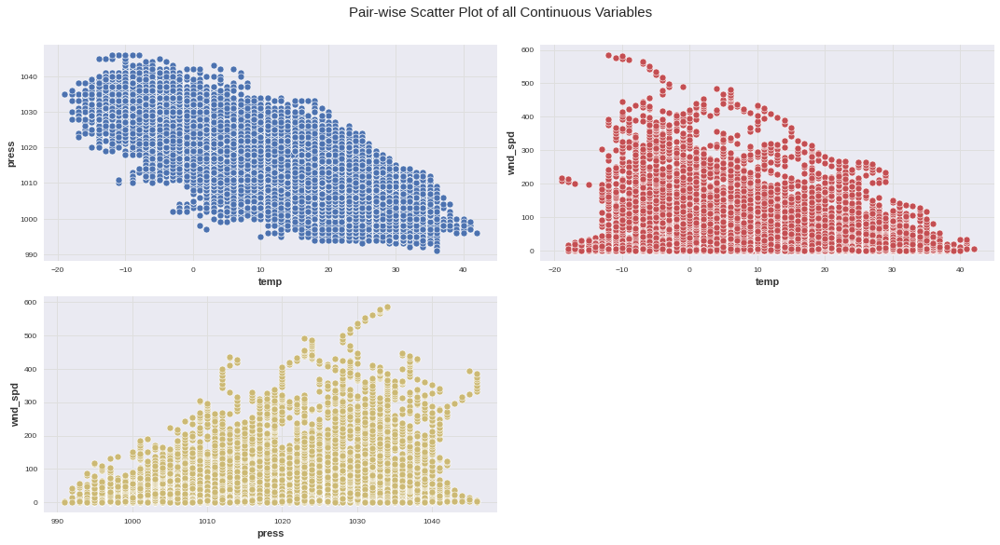

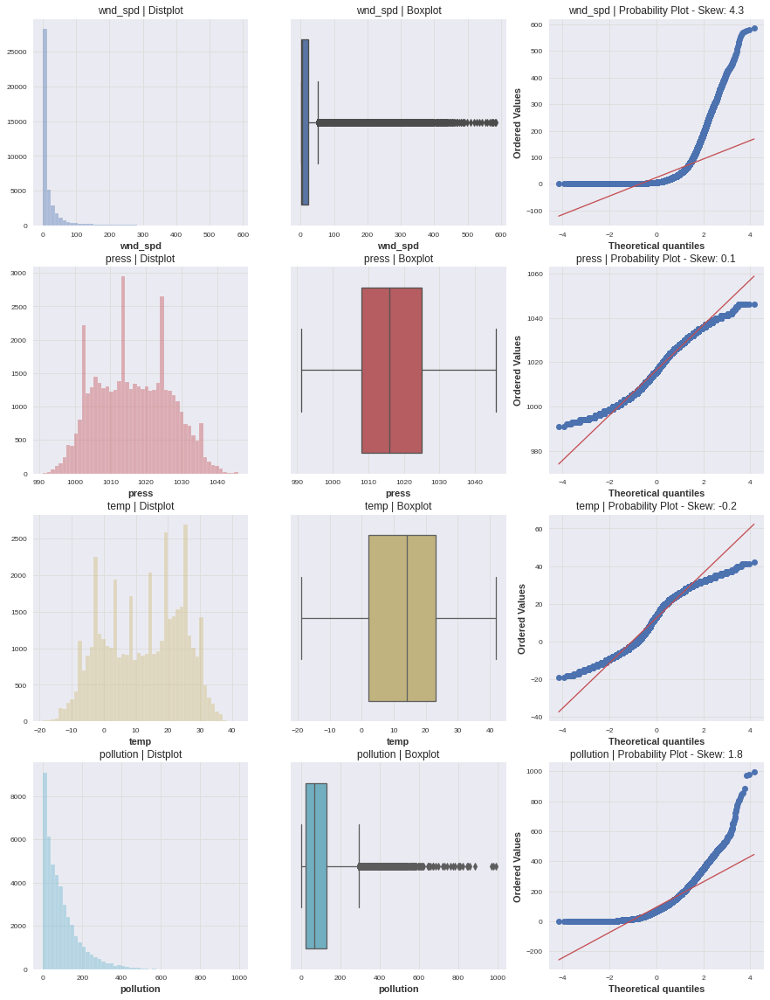

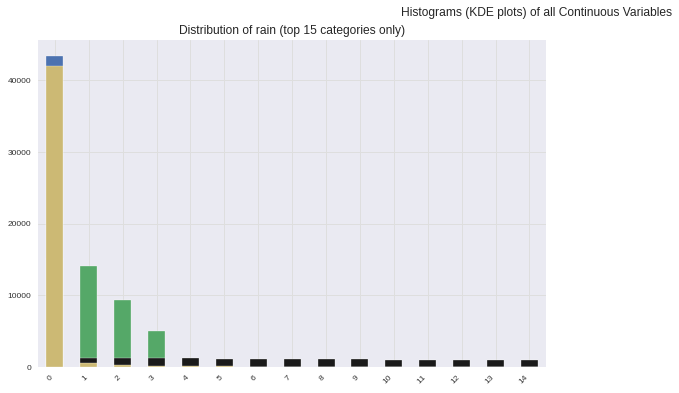

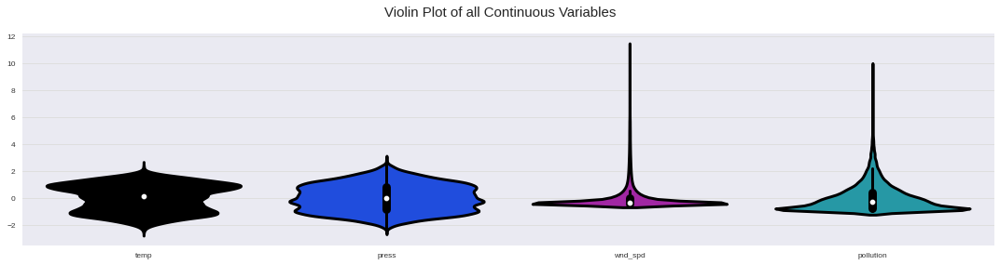

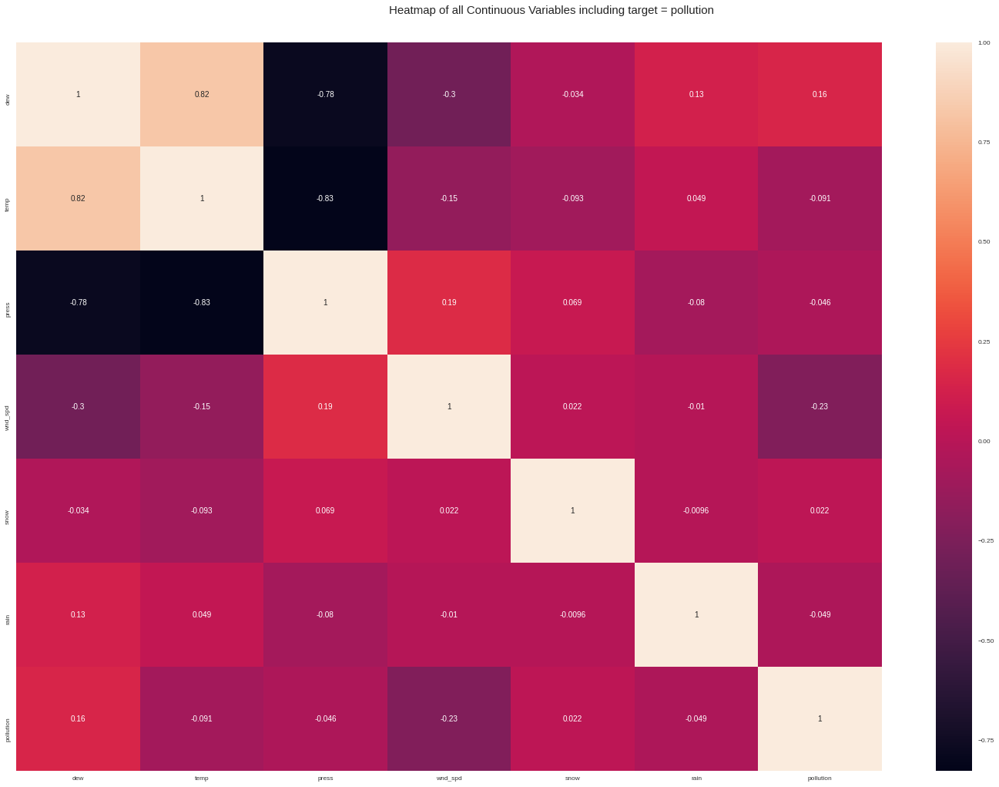

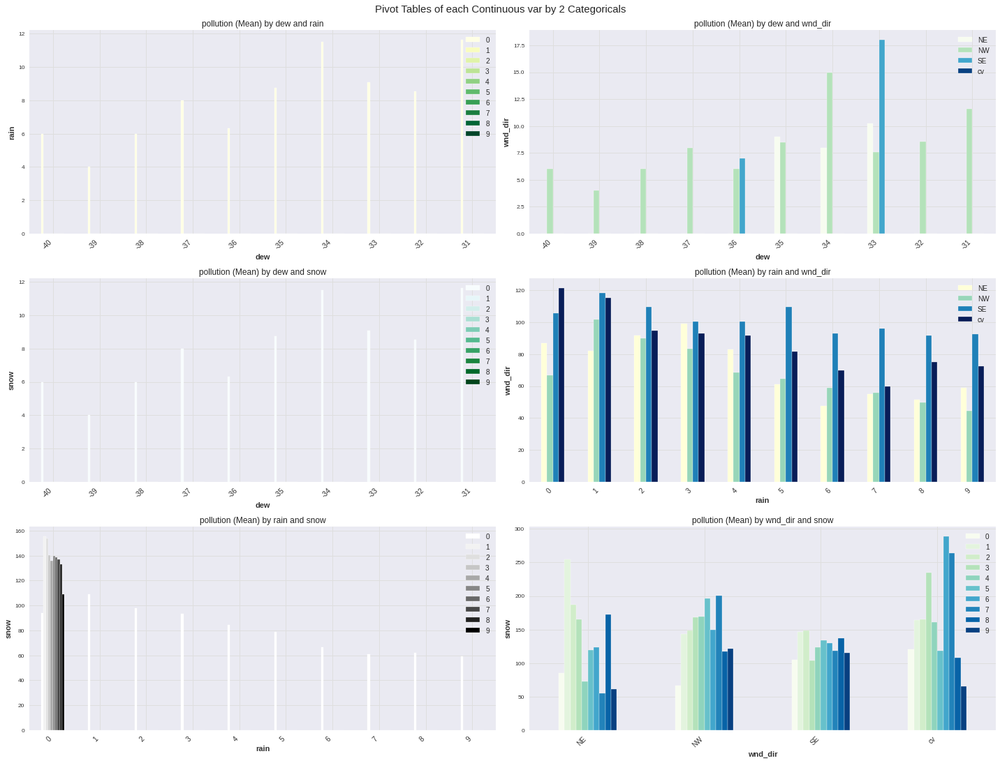

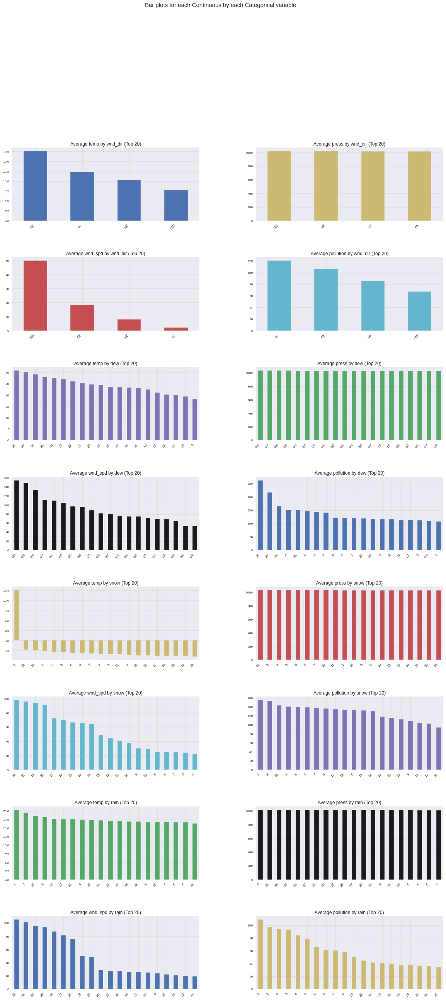

All Plots done
Time to run AutoViz (in seconds) = 15.061

 ###################### VISUALIZATION Completed ########################


In [ ]:
# Análisis exploratorio automático (gráfico)
AV = AutoViz_Class()
dataset = AV.AutoViz('Dataset', depVar="pollution")

In [ ]:
# Análisis Exploratorio Automático 1 - AutoEDA - Pandas Profiling
profile = ProfileReport(df, title="Pandas Profiling Report")
profile.to_file("EDA_Report.html")

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Análisis Exploratorio Automático 2 - Auto EDA - Sweetviz
my_report = sweetviz.analyze([pd.read_csv("Dataset"),'Dataset'],target_feat="pollution")

                                             |          | [  0%]   00:00 -> (? left)

In [ ]:
# Generación del reporte
my_report.show_html("Report.html")

Report Report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


## **AutoML**

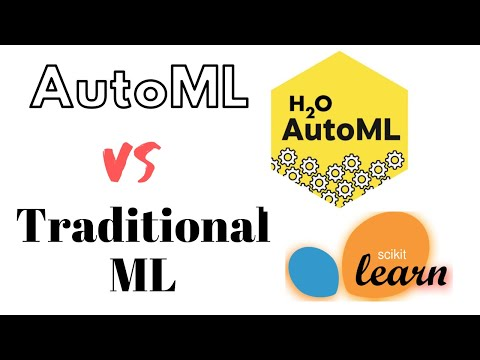

In [ ]:
# Breve introducción a AutoML
YouTubeVideo('YA_dYTNa9tc')
# https://www.youtube.com/watch?v=YA_dYTNa9tc

![picture](https://www.ericsson.com/4a949f/assets/global/qbank/2020/10/14/machine-learning-workflow-124321d41d8cd98f00b204e9800998ecf8427e.png?w=1410)

[Fuente del Ejemplo](https://github.com/SeanPLeary/time-series-h2o-automl-example/blob/master/h2o_automl_example_with_multivariate_time_series.ipynb)

Para modelar la serie temporal con métodos tradicionales de aprendizaje supervisado, se deben pre-procesar los datos. Creamos las variables lagueadas mediante la función [time_series_to_supervised](https://machinelearningmastery.com/.convert-time-series-supervised-learning-problem-python/). La función tiene los siguientes parámetros:


*   data = dataframe
*   n_lags = lags pasados
*   n_lags = lags futuros
*   selLag = selecciona una variable específica del lag pasado
*   selFut = selecciona una variable específica del lag futuro
*   dropnan = borra las líneas con NaN

En este caso tomamos el 2 lags de información para todas las variables y buscamos predecir la contaminación del período futuro









In [ ]:
def time_series_to_supervised(data, n_lag=1, n_fut=1, selLag=None, selFut=None, dropnan=True):
    """
    Converts a time series to a supervised learning data set by adding time-shifted prior and future period
    data as input or output (i.e., target result) columns for each period
    :param data:  a series of periodic attributes as a list or NumPy array
    :param n_lag: number of PRIOR periods to lag as input (X); generates: Xa(t-1), Xa(t-2); min= 0 --> nothing lagged
    :param n_fut: number of FUTURE periods to add as target output (y); generates Yout(t+1); min= 0 --> no future periods
    :param selLag:  only copy these specific PRIOR period attributes; default= None; EX: ['Xa', 'Xb' ]
    :param selFut:  only copy these specific FUTURE period attributes; default= None; EX: ['rslt', 'xx']
    :param dropnan: True= drop rows with NaN values; default= True
    :return: a Pandas DataFrame of time series data organized for supervised learning
    NOTES:
    (1) The current period's data is always included in the output.
    (2) A suffix is added to the original column names to indicate a relative time reference: e.g., (t) is the current
        period; (t-2) is from two periods in the past; (t+1) is from the next period
    (3) This is an extension of Jason Brownlee's series_to_supervised() function, customized for MFI use
    """
    n_vars = 1 if type(data) is list else data.shape[1]
    df = DataFrame(data)
    origNames = df.columns
    cols, names = list(), list()
    # include all current period attributes
    cols.append(df.shift(0))
    names += [('%s' % origNames[j]) for j in range(n_vars)]
 
    # lag any past period attributes (t-n_lag,...,t-1)
    n_lag = max(0, n_lag)  # force valid number of lag periods
    for i in range(n_lag, 0, -1):
        suffix= '(t-%d)' % i
        if (None == selLag):   # copy all attributes from PRIOR periods?
            cols.append(df.shift(i))
            names += [('%s%s' % (origNames[j], suffix)) for j in range(n_vars)]
        else:
            for var in (selLag):
                cols.append(df[var].shift(i))
                names+= [('%s%s' % (var, suffix))]
 
    # include future period attributes (t+1,...,t+n_fut)
    n_fut = max(n_fut, 0)  # force valid number of future periods to shift back
    for i in range(1, n_fut + 1):
        suffix= '(t+%d)' % i
        if (None == selFut):  # copy all attributes from future periods?
            cols.append(df.shift(-i))
            names += [('%s%s' % (origNames[j], suffix)) for j in range(n_vars)]
        else:  # copy only selected future attributes
            for var in (selFut):
                cols.append(df[var].shift(-i))
                names += [('%s%s' % (var, suffix))]
    # combine everything
    agg = concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values introduced by lagging
    if dropnan:
        agg.dropna(inplace=True)
    return agg
 

In [ ]:
# Se aplica la función time_series_to_supervised
df_processed = time_series_to_supervised(df, n_lag=1, n_fut=1 , selLag=None, selFut=['pollution'], dropnan=True)
df_processed.head()

,pollution,dew,temp,press,wnd_dir,wnd_spd,snow,rain,pollution(t-1),dew(t-1),temp(t-1),press(t-1),wnd_dir(t-1),wnd_spd(t-1),snow(t-1),rain(t-1),pollution(t+1)
date,,,,,,,,,,,,,,,,,
2010-01-02 01:00:00,148.0,-15,-4.0,1020.0,SE,2.68,0,0,129.0,-16.0,-4.0,1020.0,SE,1.79,0.0,0.0,159.0
2010-01-02 02:00:00,159.0,-11,-5.0,1021.0,SE,3.57,0,0,148.0,-15.0,-4.0,1020.0,SE,2.68,0.0,0.0,181.0
2010-01-02 03:00:00,181.0,-7,-5.0,1022.0,SE,5.36,1,0,159.0,-11.0,-5.0,1021.0,SE,3.57,0.0,0.0,138.0
2010-01-02 04:00:00,138.0,-7,-5.0,1022.0,SE,6.25,2,0,181.0,-7.0,-5.0,1022.0,SE,5.36,1.0,0.0,109.0
2010-01-02 05:00:00,109.0,-7,-6.0,1022.0,SE,7.14,3,0,138.0,-7.0,-5.0,1022.0,SE,6.25,2.0,0.0,105.0


In [ ]:
# Separación en entrenamiento (80%) y testeo (20%)
df_processed.reset_index(drop=True,inplace=True) # reseteo el índice
df_train = df_processed.loc[:int(df_processed.shape[0]*0.8),:]
df_test = df_processed.loc[int(df_processed.shape[0]*0.8):,:]

In [ ]:
# Visualziación de la base de entrenamiento
df_train.head()

,pollution,dew,temp,press,wnd_dir,wnd_spd,snow,rain,pollution(t-1),dew(t-1),temp(t-1),press(t-1),wnd_dir(t-1),wnd_spd(t-1),snow(t-1),rain(t-1),pollution(t+1)
0,148.0,-15,-4.0,1020.0,SE,2.68,0,0,129.0,-16.0,-4.0,1020.0,SE,1.79,0.0,0.0,159.0
1,159.0,-11,-5.0,1021.0,SE,3.57,0,0,148.0,-15.0,-4.0,1020.0,SE,2.68,0.0,0.0,181.0
2,181.0,-7,-5.0,1022.0,SE,5.36,1,0,159.0,-11.0,-5.0,1021.0,SE,3.57,0.0,0.0,138.0
3,138.0,-7,-5.0,1022.0,SE,6.25,2,0,181.0,-7.0,-5.0,1022.0,SE,5.36,1.0,0.0,109.0
4,109.0,-7,-6.0,1022.0,SE,7.14,3,0,138.0,-7.0,-5.0,1022.0,SE,6.25,2.0,0.0,105.0


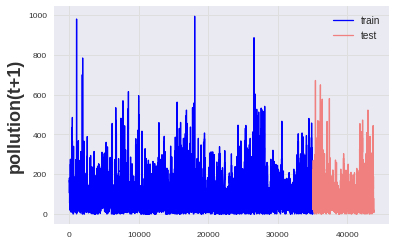

In [ ]:
# Se grafican las bases de entrenamiento y testeo juntas
plt.plot(df_train.index,df_train['pollution(t+1)'],color='blue')
plt.plot(df_test.index,df_test['pollution(t+1)'],color='lightcoral')
plt.ylabel('pollution(t+1)',fontsize=18)
plt.legend(['train','test'])
plt.show()

Se utiliza la librería H2O para el modelado.

[Documentación de H2O](https://docs.h2o.ai/h2o/latest-stable/h2o-docs/automl.html)

[Breve Introducción a H2O](https://www.datacamp.com/community/tutorials/h2o-automl?utm_source=adwords_ppc&utm_campaignid=1455363063&utm_adgroupid=65083631748&utm_device=c&utm_keyword=&utm_matchtype=b&utm_network=s&utm_adpostion=&utm_creative=278443377086&utm_targetid=aud-763347114660:dsa-429603003980&utm_loc_interest_ms=&utm_loc_physical_ms=1000073&gclid=CjwKCAjwtpGGBhBJEiwAyRZX2ibtKYEghiaov8V72GeEZ5pd8KmeyWlT-IIdYtQxk4RfPE-7h4KQLBoCP8sQAvD_BwE)

In [ ]:
# Se inicializa la sesión 
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.11" 2021-04-20; OpenJDK Runtime Environment (build 11.0.11+9-Ubuntu-0ubuntu2.18.04); OpenJDK 64-Bit Server VM (build 11.0.11+9-Ubuntu-0ubuntu2.18.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp7axfey6q
  JVM stdout: /tmp/tmp7axfey6q/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp7axfey6q/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.32.1.5
H2O_cluster_version_age:,4 days
H2O_cluster_name:,H2O_from_python_unknownUser_icx3q6
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"accepting new members, healthy"


In [ ]:
# Se convierten los dataframe de pandas en h2o frames
hf_train = h2o.H2OFrame(df_train)
hf_test = h2o.H2OFrame(df_test)

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


In [ ]:
# Análisis exploratorio del h2o frame de entrenamiento
hf_train.describe()

Rows:35039
Cols:17




,pollution,dew,temp,press,wnd_dir,wnd_spd,snow,rain,pollution(t-1),dew(t-1),temp(t-1),press(t-1),wnd_dir(t-1),wnd_spd(t-1),snow(t-1),rain(t-1),pollution(t+1)
type,int,int,int,real,enum,real,int,int,int,int,int,real,enum,real,int,int,int
mins,0.0,-33.0,-19.0,991.0,,0.45,0.0,0.0,0.0,-33.0,-19.0,991.0,,0.45,0.0,0.0,0.0
mean,93.35837209966049,1.773109963183872,12.154370843916785,1016.3996404007004,,24.963884528667965,0.057478809326750153,0.20988041896172863,93.36139730015174,1.773224121692951,12.154056908016868,1016.3998116384574,,24.96000656411427,0.057478809326750153,0.20988041896172863,93.35483318587804
maxs,994.0,28.0,41.0,1046.0,,585.6,27.0,36.0,994.0,28.0,41.0,1046.0,,585.6,27.0,36.0,994.0
sigma,91.90981126115078,14.494809359874703,12.306906922191068,10.386335259832615,,51.316324996508314,0.7738490378684302,1.4899490055843665,91.90923984452935,14.494653624689587,12.30717870443259,10.38634515672728,,51.31294167537916,0.7738490378684302,1.4899490055843665,91.9100945289003
zeros,1946,636,882,0,,0,34708,33523,1946,636,882,0,,0,34708,33523,1946
missing,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,148.0,-15.0,-4.0,1020.0,SE,2.68,0.0,0.0,129.0,-16.0,-4.0,1020.0,SE,1.79,0.0,0.0,159.0
1,159.0,-11.0,-5.0,1021.0,SE,3.57,0.0,0.0,148.0,-15.0,-4.0,1020.0,SE,2.68,0.0,0.0,181.0
2,181.0,-7.0,-5.0,1022.0,SE,5.36,1.0,0.0,159.0,-11.0,-5.0,1021.0,SE,3.57,0.0,0.0,138.0


In [ ]:
# Se define el target y la base de entrenamiento
y = 'pollution(t+1)'
X = hf_train.columns
X.remove(y)

In [ ]:
# Configuración de los parámetros de entrenamiento
aml = H2OAutoML(max_runtime_secs = 180,seed = 42, verbosity="info", exclude_algos=['StackedEnsemble']) # Se excluyeron los ensambles
# Inicio del entrenamiento
aml.train(x = X, 
          y = y,
          training_frame = hf_train,
          leaderboard_frame = hf_test)

AutoML progress: |
01:34:00.917: Project: AutoML_20210809_13400912
01:34:00.920: Setting stopping tolerance adaptively based on the training frame: 0.005342249270903391
01:34:00.920: Build control seed: 42
01:34:00.929: training frame: Frame key: automl_training_Key_Frame__upload_83199be48b37c9e8a247aec13bd41ed.hex    cols: 17    rows: 35039  chunks: 1    size: 858412  checksum: 2695093165254559864
01:34:00.929: validation frame: NULL
01:34:00.929: leaderboard frame: Frame key: Key_Frame__upload_8a852fade09084fac42fcd926a224cd7.hex    cols: 17    rows: 8760  chunks: 1    size: 181436  checksum: 8421467697225063246
01:34:00.930: blending frame: NULL
01:34:00.930: response column: pollution(t+1)
01:34:00.930: fold column: null
01:34:00.930: weights column: null
01:34:00.956: Loading execution steps: [{XGBoost : defaults}, {GLM : defaults}, {DRF : [def_1]}, {GBM : defaults}, {DeepLearning : defaults}, {DRF : [XRT]}, {XGBoost : grids}, {GBM : grids}, {DeepLearning : grids}, {GBM : [lr_anne

In [ ]:
# Listado de los modelos ganadores
lb = aml.leaderboard
lb

model_id,mean_residual_deviance,rmse,mse,mae,rmsle
XGBoost_grid__1_AutoML_20210809_013400_model_1,557.83,23.6184,557.83,12.7839,0.43927
XGBoost_3_AutoML_20210809_013400,570.151,23.8778,570.151,12.4812,nan
XGBoost_grid__1_AutoML_20210809_013400_model_3,577.082,24.0225,577.082,12.562,nan
XGBoost_grid__1_AutoML_20210809_013400_model_2,589.735,24.2845,589.735,12.8287,0.449621
DeepLearning_1_AutoML_20210809_013400,647.215,25.4404,647.215,14.6763,nan
GLM_1_AutoML_20210809_013400,653.875,25.571,653.875,14.4064,nan
XGBoost_2_AutoML_20210809_013400,710.38,26.653,710.38,15.5082,nan
DeepLearning_grid__1_AutoML_20210809_013400_model_1,715.284,26.7448,715.284,16.476,0.557318
XGBoost_1_AutoML_20210809_013400,761.932,27.6031,761.932,15.9731,nan
GBM_grid__1_AutoML_20210809_013400_model_1,1001.9,31.6529,1001.9,20.8146,0.642483


El modelo ganador es un Xboost, se elije aquel modelo que tenga mejores medidas de precisión. Definición de las medidas de precisión:

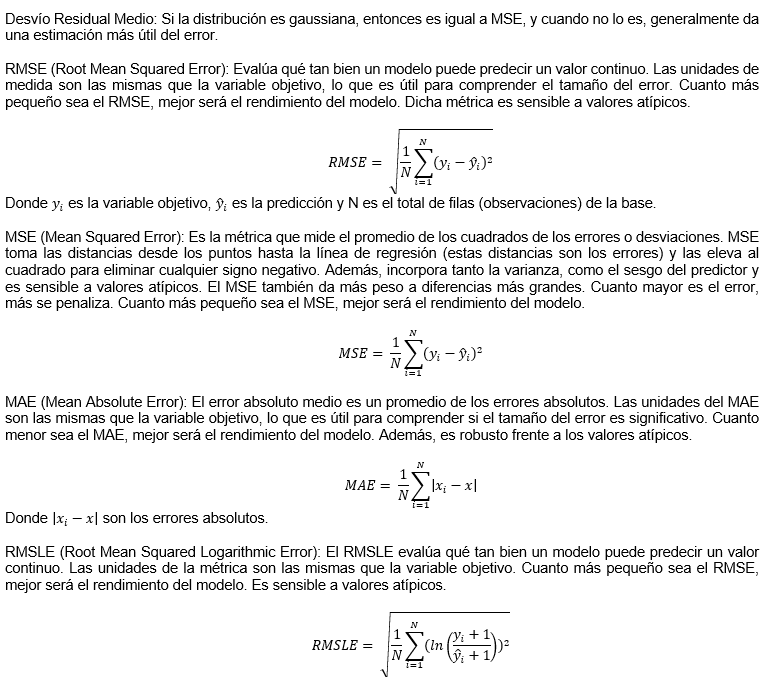

Info adicional de medidas de precisión: [link1](https://stats.stackexchange.com/questions/194453/interpreting-accuracy-results-for-an-arima-model-fit) [link2](https://www.youtube.com/watch?v=KzHJXdFJSIQ)

In [ ]:
# Se elige el modelo ganador
leader_model = aml.leader

In [ ]:
# Se realizan las predicciones en la base de testeo
hf_test_predict = leader_model.predict(hf_test)

xgboost prediction progress: |████████████████████████████████████████████| 100%


In [ ]:
# Previsualización de las predicciones
hf_test_predict.head(5)

predict
21.4268
21.4268
43.0002
61.7216
63.8521


In [ ]:
# Predicción vs Valores Reales
df_results = pd.DataFrame()
df_results['ground_truth'] = df_test['pollution(t+1)'].reset_index(drop=True) # valores reales
df_results['predictions'] = h2o.as_list(hf_test_predict,use_pandas=True) # predicciones
df_results.head()

,ground_truth,predictions
0,24.0,21.426802
1,53.0,21.426802
2,65.0,43.000210
3,70.0,61.721638
4,79.0,63.852150


In [ ]:
# Medidas de precisión
perf = aml.leader.model_performance(hf_test)
perf


ModelMetricsRegression: xgboost
** Reported on test data. **

MSE: 557.8299342813283
RMSE: 23.61842361973653
MAE: 12.783855162183308
RMSLE: 0.43927015300224176
Mean Residual Deviance: 557.8299342813283


In [ ]:
# Listado de modelos
model_ids = list(aml.leaderboard['model_id'].as_data_frame().iloc[:,0])
model_ids

['XGBoost_grid__1_AutoML_20210809_013400_model_1',
 'XGBoost_3_AutoML_20210809_013400',
 'XGBoost_grid__1_AutoML_20210809_013400_model_3',
 'XGBoost_grid__1_AutoML_20210809_013400_model_2',
 'DeepLearning_1_AutoML_20210809_013400',
 'GLM_1_AutoML_20210809_013400',
 'XGBoost_2_AutoML_20210809_013400',
 'DeepLearning_grid__1_AutoML_20210809_013400_model_1',
 'XGBoost_1_AutoML_20210809_013400',
 'GBM_grid__1_AutoML_20210809_013400_model_1',
 'DRF_1_AutoML_20210809_013400',
 'XRT_1_AutoML_20210809_013400',
 'GBM_3_AutoML_20210809_013400',
 'GBM_2_AutoML_20210809_013400',
 'GBM_5_AutoML_20210809_013400',
 'DeepLearning_grid__2_AutoML_20210809_013400_model_1',
 'GBM_4_AutoML_20210809_013400',
 'GBM_1_AutoML_20210809_013400',
 'GBM_grid__1_AutoML_20210809_013400_model_2']

In [ ]:
# Modelo ganador
h2o.get_model([mid for mid in model_ids if "XGBoost" in mid][0])

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid__1_AutoML_20210809_013400_model_1


Model Summary: 


,,number_of_trees
0,,92.0




ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 602.4055260225398
RMSE: 24.54395090490811
MAE: 13.017808650117741
RMSLE: NaN
Mean Residual Deviance: 602.4055260225398

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 708.20974817175
RMSE: 26.612210508932737
MAE: 13.707872149883167
RMSLE: NaN
Mean Residual Deviance: 708.20974817175

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,13.707864,0.27124375,13.602745,14.121523,13.799586,13.616382,13.39908
1,mean_residual_deviance,708.20886,56.285965,664.2487,799.83765,674.7776,724.8084,677.372
2,mse,708.20886,56.285965,664.2487,799.83765,674.7776,724.8084,677.372
3,r2,0.91615015,0.0068133622,0.92123,0.9049056,0.91940224,0.9145547,0.9206581
4,residual_deviance,708.20886,56.285965,664.2487,799.83765,674.7776,724.8084,677.372
5,rmse,26.59591,1.0407448,25.773024,28.2814,25.97648,26.922266,26.026371
6,rmsle,NaN,0.0,NaN,NaN,NaN,NaN,NaN



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
0,,2021-08-09 01:35:38,19.595 sec,0.0,130.649319,92.910371,17069.244435
1,,2021-08-09 01:35:38,19.670 sec,5.0,41.387300,23.739628,1712.908631
2,,2021-08-09 01:35:38,19.708 sec,10.0,29.660996,15.606757,879.774713
3,,2021-08-09 01:35:39,19.770 sec,15.0,27.898796,14.532278,778.342799
4,,2021-08-09 01:35:39,19.811 sec,20.0,27.191024,14.214176,739.351782
5,,2021-08-09 01:35:39,19.857 sec,25.0,26.673628,13.871339,711.482451
6,,2021-08-09 01:35:39,19.908 sec,30.0,26.342318,13.760230,693.917717
7,,2021-08-09 01:35:39,19.965 sec,35.0,26.152248,13.684190,683.940062
8,,2021-08-09 01:35:39,20.048 sec,40.0,25.942956,13.584849,673.036983
9,,2021-08-09 01:35:39,20.134 sec,45.0,25.726634,13.453812,661.859671



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,pollution(t-1),1.764667e+08,1.000000,0.566909
1,pollution,1.252544e+08,0.709790,0.402387
2,wnd_spd,2.310694e+06,0.013094,0.007423
3,temp,1.050960e+06,0.005956,0.003376
4,wnd_spd(t-1),1.037783e+06,0.005881,0.003334
5,wnd_dir.SE,9.732579e+05,0.005515,0.003127
6,dew,7.111941e+05,0.004030,0.002285
7,wnd_dir(t-1).NW,5.964489e+05,0.003380,0.001916
8,temp(t-1),5.526947e+05,0.003132,0.001776
9,dew(t-1),5.469582e+05,0.003099,0.001757



See the whole table with table.as_data_frame()


In [ ]:
out = h2o.get_model([mid for mid in model_ids if "XGBoost" in mid][0])

In [ ]:
# Parámetros del modelo ganador
out.params

{'model_id': {'default': None,
  'actual': {'__meta': {'schema_version': 3,
    'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>'},
   'name': 'XGBoost_grid__1_AutoML_20210809_013400_model_1',
   'type': 'Key<Model>',
   'URL': '/3/Models/XGBoost_grid__1_AutoML_20210809_013400_model_1'},
  'input': None},
 'training_frame': {'default': None,
  'actual': {'__meta': {'schema_version': 3,
    'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>'},
   'name': 'automl_training_Key_Frame__upload_83199be48b37c9e8a247aec13bd41ed.hex',
   'type': 'Key<Frame>',
   'URL': '/3/Frames/automl_training_Key_Frame__upload_83199be48b37c9e8a247aec13bd41ed.hex'},
  'input': {'__meta': {'schema_version': 3,
    'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>'},
   'name': 'automl_training_Key_Frame__upload_83199be48b37c9e8a247aec13bd41ed.hex',
   'type': 'Key<Frame>',
   'URL': '/3/Frames/automl_training_Key_Frame__upload_83199be48b37c9e8a247aec13bd41ed.hex'}},
 'validation_fr

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

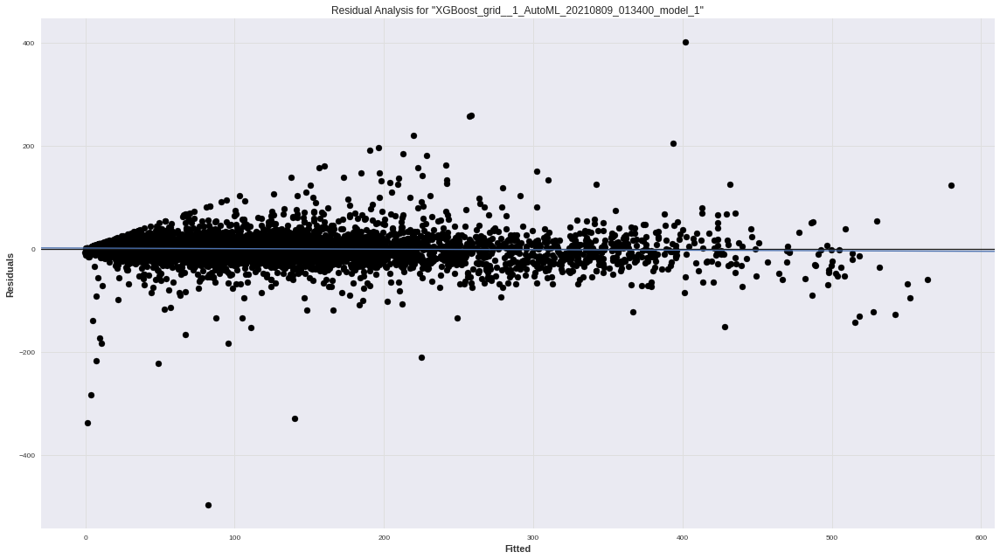

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

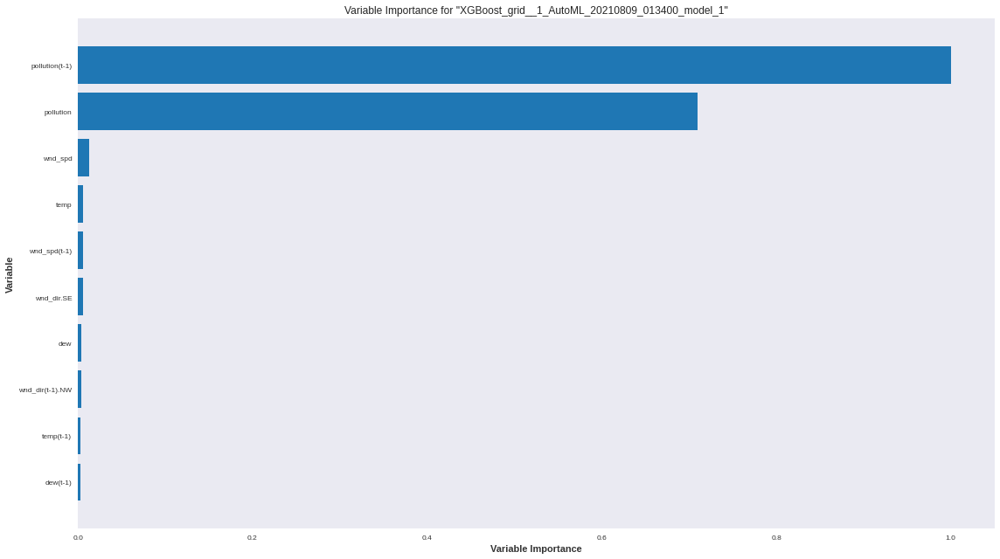

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

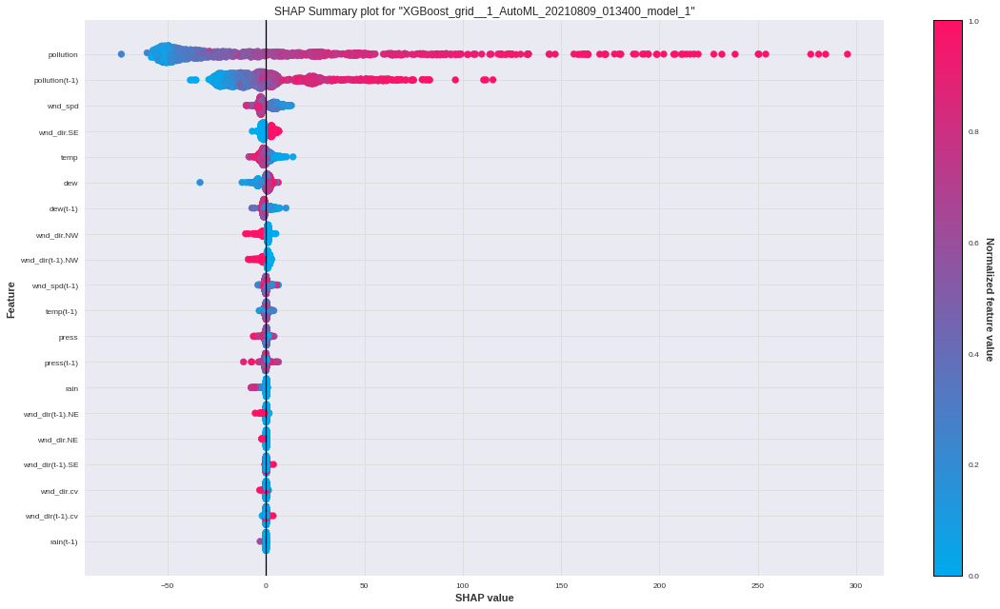

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

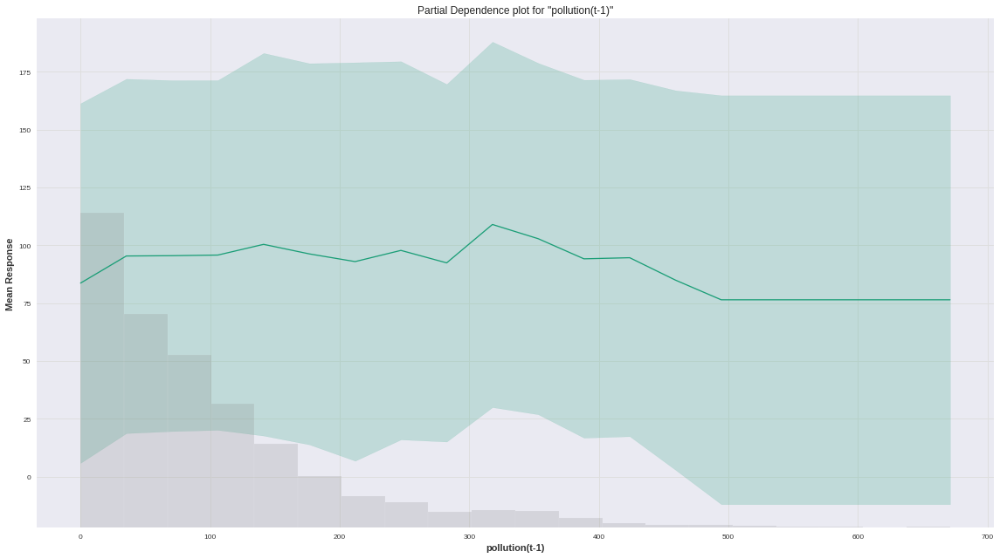

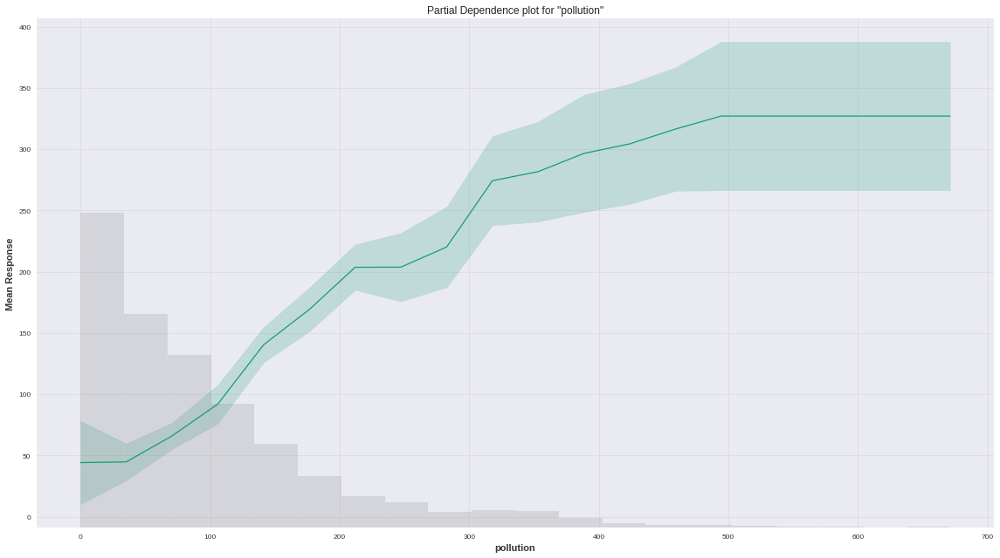

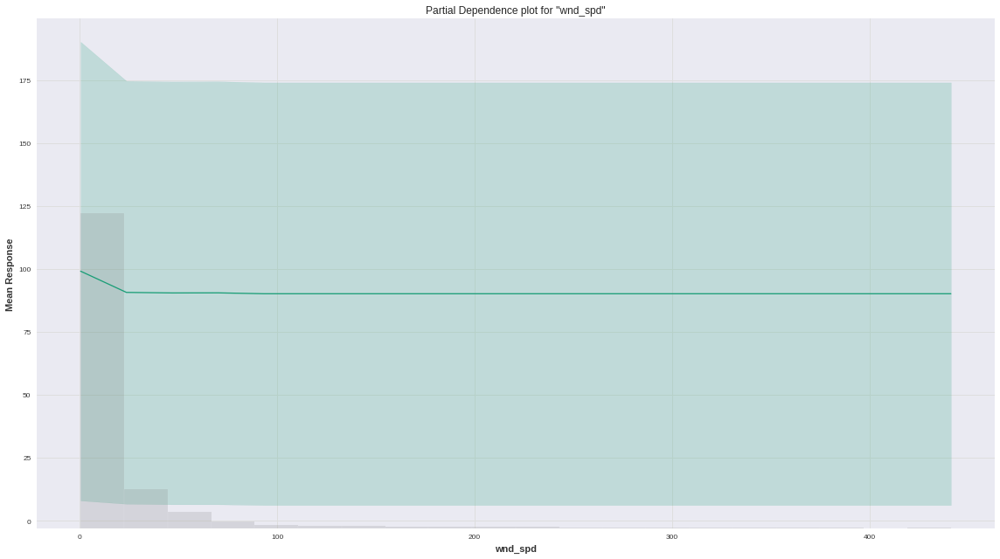

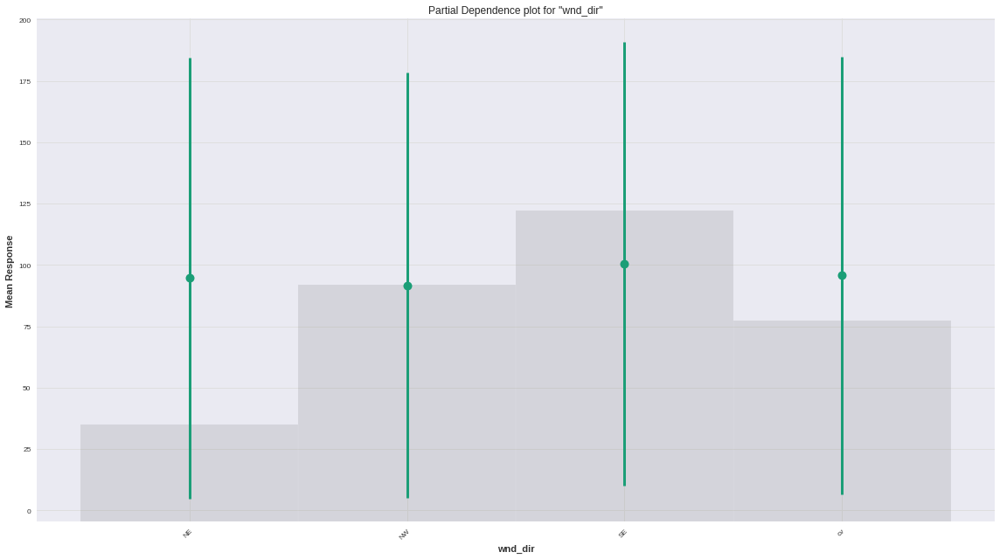

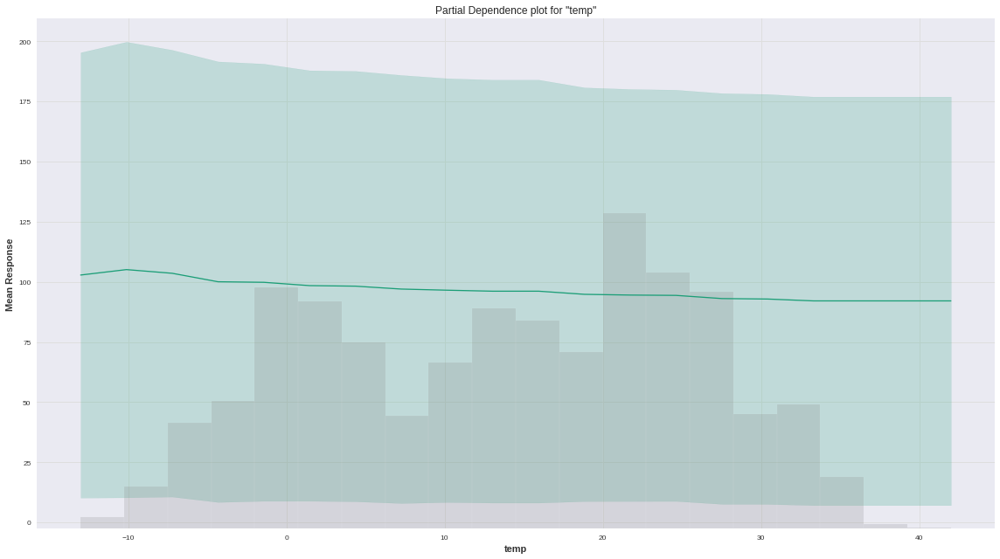

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

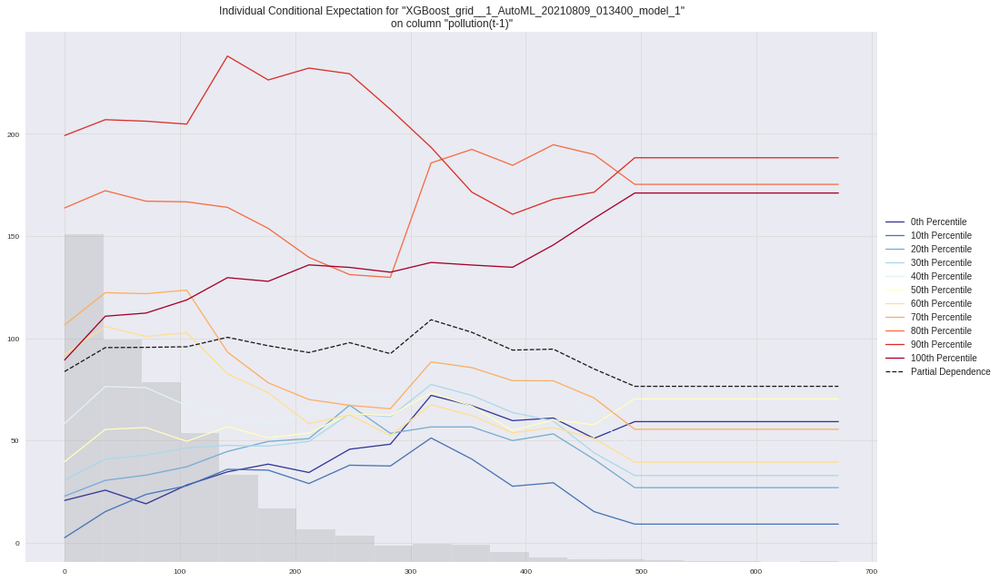

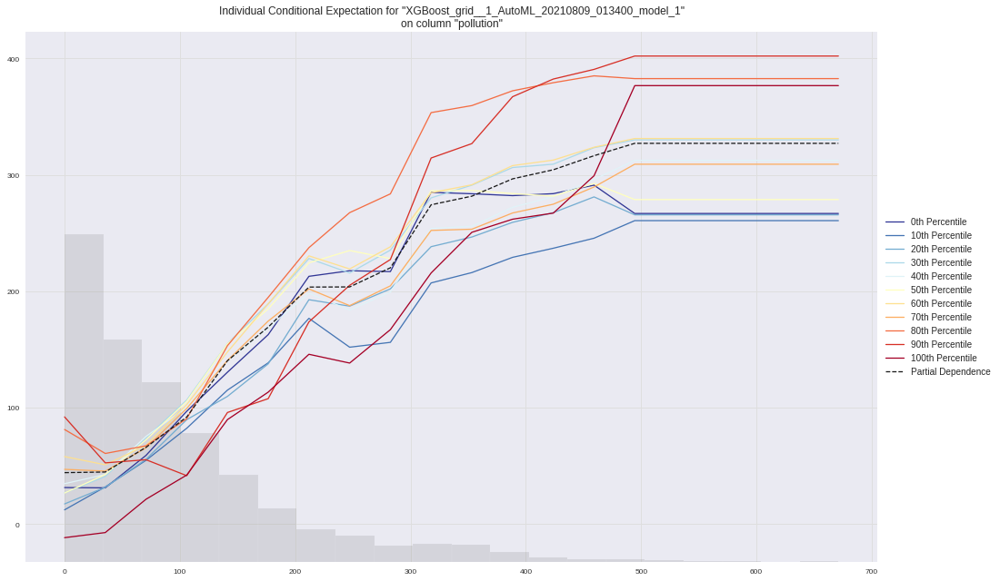

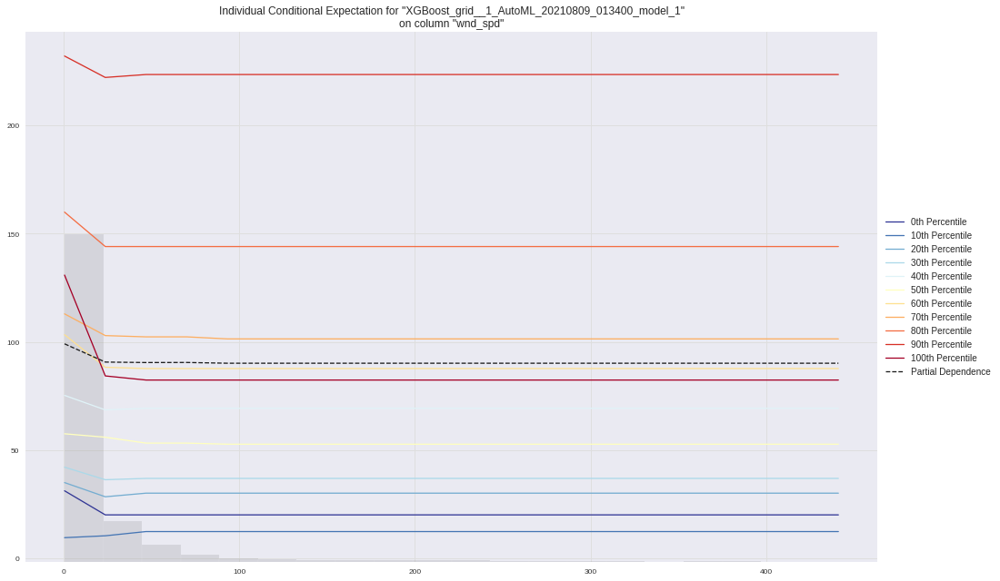

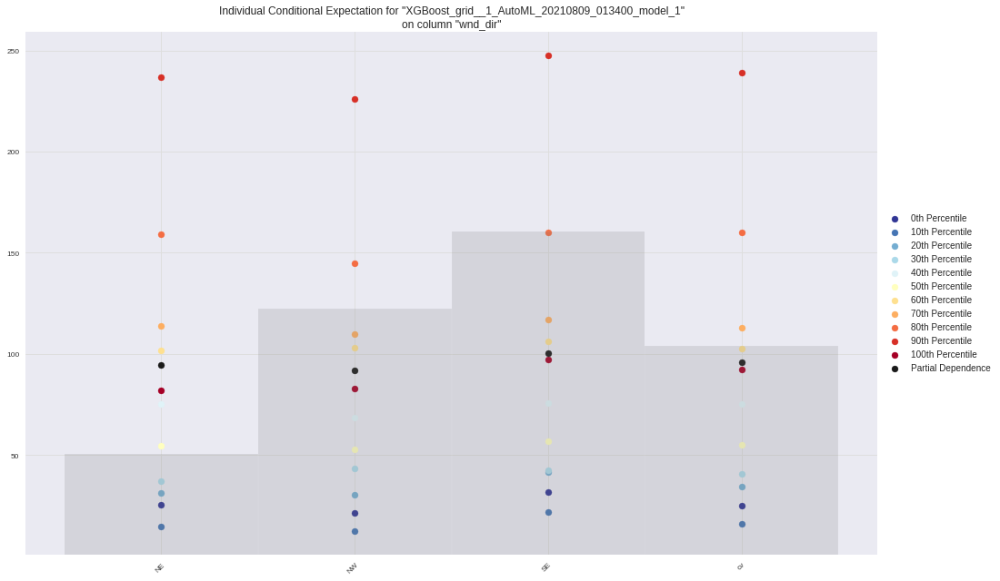

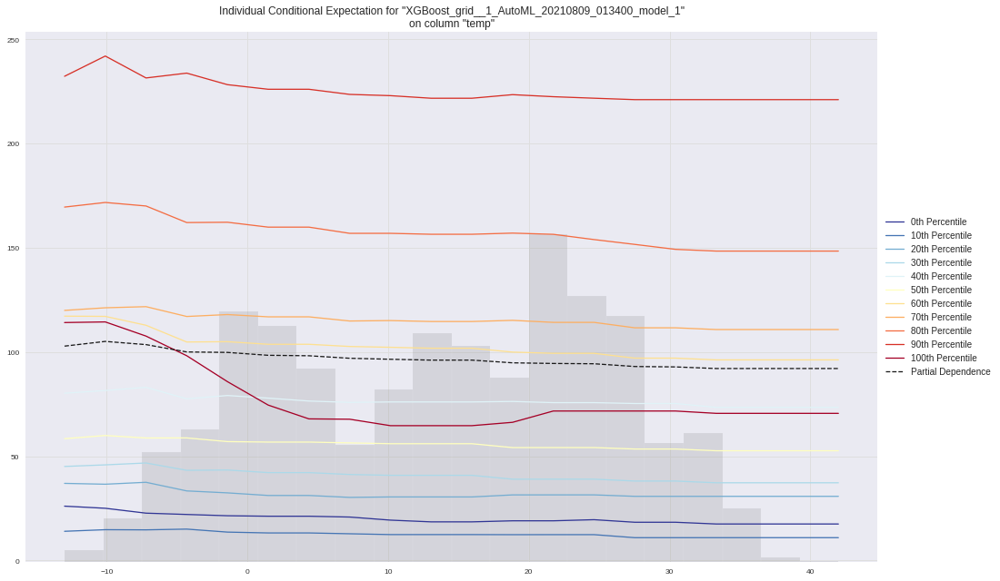

In [ ]:
# Explicación del modelo ganador
exm = aml.leader.explain(hf_test)

[Interpretación de los Gráficos](https://www.analyticsvidhya.com/blog/2021/02/unboxing-h2o-automl-models/) [Breve video sobre SHAP](https://www.youtube.com/watch?v=w9O0fkfMkx0&t=59s) [Video sobre SHAP](https://www.youtube.com/watch?v=NBg7YirBTN8)

In [ ]:
# Cálculo del R2
slope, intercept, r_value, p_value, std_err = stats.linregress(x=df_results['predictions'],y=df_results['ground_truth'])
print('R2 = ',r_value*r_value)

R2 =  0.9363903767185215


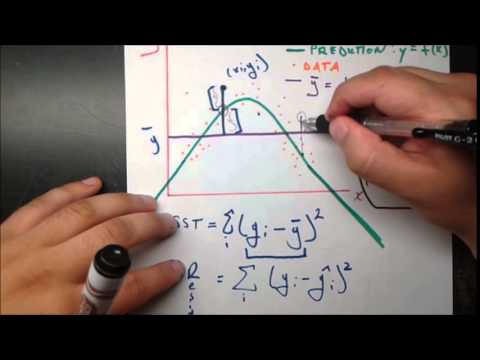

In [ ]:
# Explicación del R2
YouTubeVideo('g2ext963IZg')
# https://www.youtube.com/watch?v=g2ext963IZg

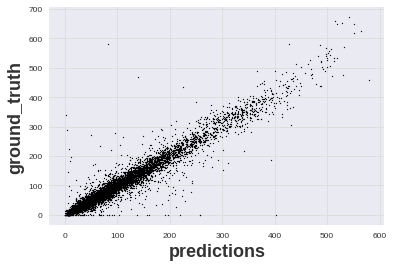

In [ ]:
# Gráfico de dispersión de las predciones y los valores reales
plt.scatter(x=df_results['predictions'],y=df_results['ground_truth'],s=1)
plt.xlabel('predictions',fontsize=18)
plt.ylabel('ground_truth',fontsize=18)
plt.show()

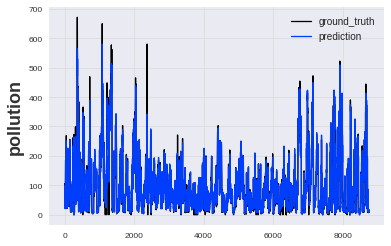

In [ ]:
# Gráfico de las predicciones junto con los valores reales
plt.plot(df_results['ground_truth'])
plt.plot(df_results['predictions'])
plt.ylabel('pollution',fontsize=18)
plt.legend(['ground_truth','prediction'])
plt.show()

En este caso usamos la librería H2O. Existen otras librerías de AutoML ([ver artículo para más detalle](https://www.linkedin.com/pulse/top-10-automated-machine-learningauto-ml-tools-used-2020-2021-sahu/?trackingId=wwK1%2FFnjSkSqy%2BDWuM0Q%2Bg%3D%3D)), como así también liberías de AutoML específicas para Series de tiempo como [AutoTS](https://winedarksea.github.io/AutoTS/build/html/index.html).

## **Bonus Track: AutoFE**
Así como existe el AutoML, también existe el AutoFE (Feature Engineering) donde se realiza ingeniería de atributos de forma automática. En este [artículo](https://medium.com/analytics-vidhya/automated-feature-engineering-tools-44d00be56e3a) se listan algunas de las liberías más conocidas. A contnuación veremos brevemente la librería [TSFresh](https://tsfresh.readthedocs.io/en/latest/text/quick_start.html) que es específica para series de tiempo. Pero existen otras liberías como por ejemplo [TSfel](https://tsfel.readthedocs.io/en/latest/index.html).




In [ ]:
# Se prueba la librería  TSFresh
df = pd.read_csv('https://raw.githubusercontent.com/sagarmk/Forecasting-on-Air-pollution-with-RNN-LSTM/master/pollution.csv')
df['id']=1 #columna dummy 
df1 = df.loc[:int(df.shape[0]*0.1),:] # 10% del dataset para que no tarde mucho y poder ver el ejemplo
extracted_features = extract_features(df1,column_id="id",column_value="pollution",column_sort='date')



Feature Extraction:   0%|          | 0/1 [00:00<?, ?it/s]

Feature Extraction: 100%|██████████| 1/1 [00:10<00:00, 10.89s/it]


In [ ]:
# Nuevas variables creadas
extracted_features

,pollution__variance_larger_than_standard_deviation,pollution__has_duplicate_max,pollution__has_duplicate_min,pollution__has_duplicate,pollution__sum_values,pollution__abs_energy,pollution__mean_abs_change,pollution__mean_change,pollution__mean_second_derivative_central,pollution__median,pollution__mean,pollution__length,pollution__standard_deviation,pollution__variation_coefficient,pollution__variance,pollution__skewness,pollution__kurtosis,pollution__root_mean_square,pollution__absolute_sum_of_changes,pollution__longest_strike_below_mean,pollution__longest_strike_above_mean,pollution__count_above_mean,pollution__count_below_mean,pollution__last_location_of_maximum,pollution__first_location_of_maximum,pollution__last_location_of_minimum,pollution__first_location_of_minimum,pollution__percentage_of_reoccurring_values_to_all_values,pollution__percentage_of_reoccurring_datapoints_to_all_datapoints,pollution__sum_of_reoccurring_values,pollution__sum_of_reoccurring_data_points,pollution__ratio_value_number_to_time_series_length,pollution__sample_entropy,pollution__maximum,pollution__minimum,pollution__benford_correlation,pollution__time_reversal_asymmetry_statistic__lag_1,pollution__time_reversal_asymmetry_statistic__lag_2,pollution__time_reversal_asymmetry_statistic__lag_3,pollution__c3__lag_1,...,pollution__energy_ratio_by_chunks__num_segments_10__segment_focus_4,pollution__energy_ratio_by_chunks__num_segments_10__segment_focus_5,pollution__energy_ratio_by_chunks__num_segments_10__segment_focus_6,pollution__energy_ratio_by_chunks__num_segments_10__segment_focus_7,pollution__energy_ratio_by_chunks__num_segments_10__segment_focus_8,pollution__energy_ratio_by_chunks__num_segments_10__segment_focus_9,pollution__ratio_beyond_r_sigma__r_0.5,pollution__ratio_beyond_r_sigma__r_1,pollution__ratio_beyond_r_sigma__r_1.5,pollution__ratio_beyond_r_sigma__r_2,pollution__ratio_beyond_r_sigma__r_2.5,pollution__ratio_beyond_r_sigma__r_3,pollution__ratio_beyond_r_sigma__r_5,pollution__ratio_beyond_r_sigma__r_6,pollution__ratio_beyond_r_sigma__r_7,pollution__ratio_beyond_r_sigma__r_10,pollution__count_above__t_0,pollution__count_below__t_0,pollution__lempel_ziv_complexity__bins_2,pollution__lempel_ziv_complexity__bins_3,pollution__lempel_ziv_complexity__bins_5,pollution__lempel_ziv_complexity__bins_10,pollution__lempel_ziv_complexity__bins_100,pollution__fourier_entropy__bins_2,pollution__fourier_entropy__bins_3,pollution__fourier_entropy__bins_5,pollution__fourier_entropy__bins_10,pollution__fourier_entropy__bins_100,pollution__permutation_entropy__dimension_3__tau_1,pollution__permutation_entropy__dimension_4__tau_1,pollution__permutation_entropy__dimension_5__tau_1,pollution__permutation_entropy__dimension_6__tau_1,pollution__permutation_entropy__dimension_7__tau_1,pollution__query_similarity_count__query_None__threshold_0.0,"pollution__matrix_profile__feature_""min""__threshold_0.98","pollution__matrix_profile__feature_""max""__threshold_0.98","pollution__matrix_profile__feature_""mean""__threshold_0.98","pollution__matrix_profile__feature_""median""__threshold_0.98","pollution__matrix_profile__feature_""25""__threshold_0.98","pollution__matrix_profile__feature_""75""__threshold_0.98"
1,1.0,0.0,1.0,1.0,378727.0,59034879.0,13.88105,-0.006621,-0.00137,68.0,86.447615,4381.0,77.472681,0.896181,6002.016258,1.951023,9.165203,116.082756,60799.0,152.0,107.0,1720.0,2661.0,0.236019,0.235791,0.944533,0.118923,0.836735,0.987218,43181.0,358018.0,0.078293,0.392535,980.0,0.0,0.973222,69848.671386,22954.451451,57674.6544,2.466629e+06,...,0.128105,0.132527,0.055789,0.068335,0.066159,0.107358,0.630906,0.21753,0.086053,0.042,0.022141,0.011413,0.00137,0.001141,0.000913,0.000228,1.0,0.060945,0.029902,0.030358,0.043369,0.082858,0.287834,0.110453,0.125256,0.215617,0.388782,1.149024,1.650763,2.797582,4.069,5.385709,6.505601,NaN,1.818803,8.781521,5.090706,4.996962,4.125419,6.150554


## **Redes Neuronales LSTM**

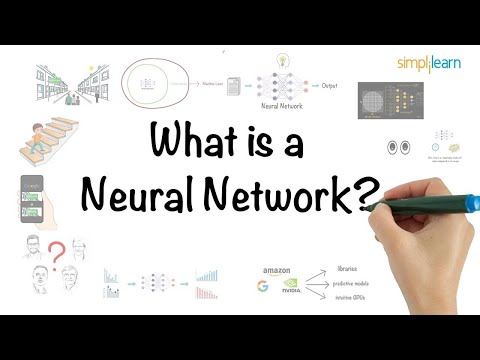

In [ ]:
# Breve introducción a las redes neuronales
YouTubeVideo('bfmFfD2RIcg')
# https://www.youtube.com/watch?v=bfmFfD2RIcg

[Libro](https://github.com/ProWhalen/AndrewNg-ML/blob/master/Make%20Your%20Own%20Neural%20Network.pdf) que explica las redes neuronales de forma fácil.

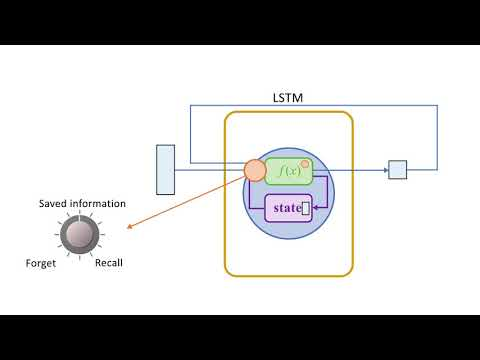

In [ ]:
# Breve introducción a las redes LSTM
YouTubeVideo('5dMXyiWddYs')
# https://www.youtube.com/watch?v=5dMXyiWddYs

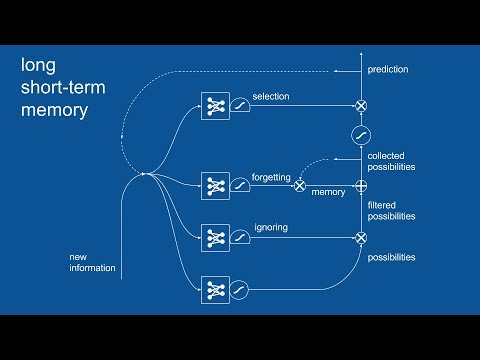

In [ ]:
# Explicación 1 sobre redes LSTM
YouTubeVideo('WCUNPb-5EYI')
# https://www.youtube.com/watch?v=WCUNPb-5EYI

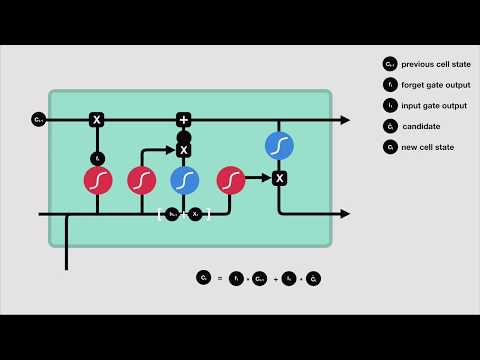

In [ ]:
# Explicación 2 sobre redes LSTM
YouTubeVideo('8HyCNIVRbSU')
# https://www.youtube.com/watch?v=8HyCNIVRbSU

En los siguientes links se encontrará mayor información sobre redes neuronales y redes LSTM: [link 1](https://towardsdatascience.com/illustrated-guide-to-lstms-and-gru-s-a-step-by-step-explanation-44e9eb85bf21) y [link 2](https://bookdown.org/amanas/traficomadrid/m%C3%A9todos-basados-en-deep-learning.html)

[Explicación de las redes LSTM en Keras](https://www.kaggle.com/kmkarakaya/lstm-output-types-return-sequences-state)

Vamos a resolver el ejemplo anterior (contaminación) pero con una red LSTM. [Fuente del Ejemplo](https://machinelearningmastery.com/multivariate-time-series-forecasting-lstms-keras/)

El primer paso es preparar el conjunto de datos de contaminación para la red LSTM. Esto implica adaptar el conjunto de datos a un problema de aprendizaje supervisado y normalizar las variables de entrada. Para ello se utiliza la función [series_to_supervise](https://machinelearningmastery.com/.convert-time-series-supervised-learning-problem-python/). Esta función crea los distintos lags de las variables.

In [ ]:
# Pre-procesamiento de la base
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols, names = list(), list()
	# Secuendia de entrada (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# Secuencia de forecast (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# Se une todo
	agg = concat(cols, axis=1)
	agg.columns = names
	# se eliminan las filas con NaN
	if dropnan:
		agg.dropna(inplace=True)
	return agg

In [ ]:
ejemplo = series_to_supervised(df,1,1) # (base de datos, lag pasados, lags futuros-1)
ejemplo.head()

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var1(t),var2(t),var3(t),var4(t),var5(t),var6(t),var7(t),var8(t)
date,,,,,,,,,,,,,,,,
2010-01-02 01:00:00,129.0,-16.0,-4.0,1020.0,SE,1.79,0.0,0.0,148.0,-15,-4.0,1020.0,SE,2.68,0,0
2010-01-02 02:00:00,148.0,-15.0,-4.0,1020.0,SE,2.68,0.0,0.0,159.0,-11,-5.0,1021.0,SE,3.57,0,0
2010-01-02 03:00:00,159.0,-11.0,-5.0,1021.0,SE,3.57,0.0,0.0,181.0,-7,-5.0,1022.0,SE,5.36,1,0
2010-01-02 04:00:00,181.0,-7.0,-5.0,1022.0,SE,5.36,1.0,0.0,138.0,-7,-5.0,1022.0,SE,6.25,2,0
2010-01-02 05:00:00,138.0,-7.0,-5.0,1022.0,SE,6.25,2.0,0.0,109.0,-7,-6.0,1022.0,SE,7.14,3,0


Se predice la contaminación dada la medición y las condiciones climáticas en el período anterior.

In [ ]:
# Se carga la base
dataset = pd.read_csv('https://raw.githubusercontent.com/sagarmk/Forecasting-on-Air-pollution-with-RNN-LSTM/master/pollution.csv',index_col=0)
values = dataset.values
# Encoder para la variable "dirección del viento"
encoder = LabelEncoder()
values[:,4] = encoder.fit_transform(values[:,4])
# Me aseguro que todas las variables sean numéricas
values = values.astype('float32')
# Normalizo las variables
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# Lo encuadro en un problema de aprendizaje supervisado
reframed = series_to_supervised(scaled, 1, 1)
# Sacamos las columnas que no queremos predecir
reframed.drop(reframed.columns[[9,10,11,12,13,14,15]], axis=1, inplace=True)
print(reframed.head())

   var1(t-1)  var2(t-1)  var3(t-1)  ...  var7(t-1)  var8(t-1)   var1(t)
1   0.129779   0.352941   0.245902  ...   0.000000        0.0  0.148893
2   0.148893   0.367647   0.245902  ...   0.000000        0.0  0.159960
3   0.159960   0.426471   0.229508  ...   0.000000        0.0  0.182093
4   0.182093   0.485294   0.229508  ...   0.037037        0.0  0.138833
5   0.138833   0.485294   0.229508  ...   0.074074        0.0  0.109658

[5 rows x 9 columns]


Podemos ver las 8 variables de entrada y la variable de salida: nivel de contaminación en la hora actual var1(t)

In [ ]:
# Se divide en entrenamiento y testeo
values = reframed.values
n_train_hours = 365 * 24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# Se divide en entradas y salidas
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]
# Se configura la entrada para que sea en 3 dimensiones como espera la red LSTM [muestras, períodos de tiempo, variables]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8760, 1, 8) (8760,) (35039, 1, 8) (35039,)


Para acelerar el entrenamiento del modelo  solo se entrenó con el primer año de datos y luego se lo evaluará en los 4 años restantes de datos. 

Epoch 1/50
122/122 - 4s - loss: 0.0565 - val_loss: 0.0559
Epoch 2/50
122/122 - 2s - loss: 0.0393 - val_loss: 0.0620
Epoch 3/50
122/122 - 2s - loss: 0.0232 - val_loss: 0.0522
Epoch 4/50
122/122 - 1s - loss: 0.0170 - val_loss: 0.0393
Epoch 5/50
122/122 - 1s - loss: 0.0156 - val_loss: 0.0251
Epoch 6/50
122/122 - 1s - loss: 0.0151 - val_loss: 0.0189
Epoch 7/50
122/122 - 1s - loss: 0.0150 - val_loss: 0.0182
Epoch 8/50
122/122 - 1s - loss: 0.0149 - val_loss: 0.0171
Epoch 9/50
122/122 - 1s - loss: 0.0148 - val_loss: 0.0160
Epoch 10/50
122/122 - 1s - loss: 0.0147 - val_loss: 0.0152
Epoch 11/50
122/122 - 2s - loss: 0.0147 - val_loss: 0.0148
Epoch 12/50
122/122 - 1s - loss: 0.0148 - val_loss: 0.0147
Epoch 13/50
122/122 - 1s - loss: 0.0147 - val_loss: 0.0139
Epoch 14/50
122/122 - 1s - loss: 0.0147 - val_loss: 0.0137
Epoch 15/50
122/122 - 1s - loss: 0.0147 - val_loss: 0.0136
Epoch 16/50
122/122 - 2s - loss: 0.0146 - val_loss: 0.0137
Epoch 17/50
122/122 - 1s - loss: 0.0148 - val_loss: 0.0137
Epoch 

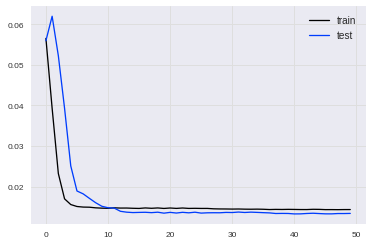

In [ ]:
# Diseño con 50 neuronas en la capa oculta y 1 neurona de salida
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
# Se designa el MAE como función de perdida y la versión "adam" del descenso de gradiente
model.compile(loss='mae', optimizer='adam')
# Se entrena
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)
# Se muestra el historial
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

El gráfico muesta la función de pérdida en el entrenamiento y testeo para cada corrida. Un síntoma de overfitting hubiese sido que el gráfico sea algo así:

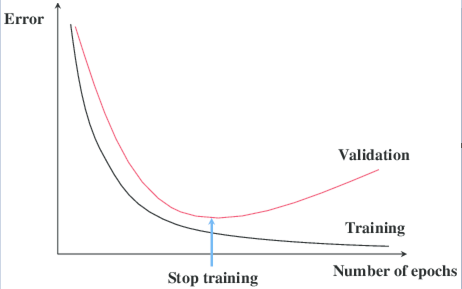

[Formas de prevenir el overfitting](https://towardsdatascience.com/8-simple-techniques-to-prevent-overfitting-4d443da2ef7d)

In [ ]:
# Se realizan las predicciones
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
# Se reescalan las mismas
inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# Medidas de precisión
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(inv_y, inv_yhat)
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(inv_y, inv_yhat)
print('Test MAE: %.3f' % mae)
r2 = r2_score(inv_y, inv_yhat)
print('Test R2: %.3f' % r2)

Test RMSE: 26.420
Test MSE: 698.012
Test MAE: 13.328
Test R2: 0.918


# **Ejemplo Dataset Air Passengers**

[Fuente del Dataset](https://www.kaggle.com/rakannimer/air-passengers)

Indica la cantidad de pasajeros mensual desde Ene-1940 a Dic-1960.

Libro práctico para teoría de series temporales: [Forecasting: Principles and Practice](https://otexts.com/fpp2/)

## **Análisis Exploratorio**

[Fuente del Ejemplo1](https://www.kaggle.com/manas13/time-series-air-passenger) [Fuente del Ejemplo 2](https://www.kaggle.com/harshitmakkar/univariate-time-series-analysis-arima-and-sarima) [Fuente del Ejemplo 3](http://nmmarcelnv.pythonanywhere.com/blogs/timeseries)

In [4]:
# Se define el date parser que convierte un formato texto en formato fecha
custom_date_parser = lambda dates: pd.datetime.strptime(dates, '%Y-%m')
# Se carga la base de datos
df = pd.read_csv('AirPassengers.csv',parse_dates = ['Month'],index_col='Month',date_parser = custom_date_parser)
df.head()

,#Passengers
Month,
1949-01-01,112
1949-02-01,118
1949-03-01,132
1949-04-01,129
1949-05-01,121


Repasemos los parámetros en el código read_csv anterior:

**parse_dates:** le dice que analicen la columna especificada como fecha.

**index_col:** especifica qué columna usar como índice. Al analizar series de tiempo en Pandas, es importante que la variable que contiene la información de tiempo se use como índice.

**date_parser:** especifica cómo analizar la fecha. Por defecto, pandas usa el formato 'AAAA-MM-DD HH: MM: SS'. Entonces, si la fecha que queremos analizar no está en este formato, necesitamos definir un formato personalizado. 

In [6]:
# Se convierte el dataframe a una serie de tiempo
ts = df['#Passengers']
ts.head()

Month
1949-01-01    112
1949-02-01    118
1949-03-01    132
1949-04-01    129
1949-05-01    121
Name: #Passengers, dtype: int64

<AxesSubplot:xlabel='Month'>

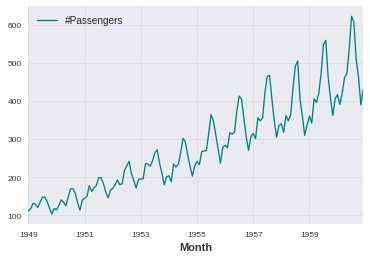

In [ ]:
# Se grafica la serie
df.plot(color='teal')

Vemos que la serie tiene una clara tendencia y estacionalidad

Text(0.5, 0, 'Densidad de los pasajeros')

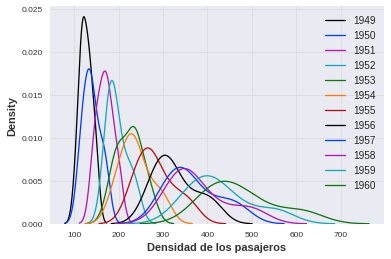

In [ ]:
# Se grafica la densidad de los pasajeros para los distintos años
df = pd.read_csv('AirPassengers.csv', parse_dates=['Month'], index_col='Month')
df.reset_index(inplace=True)

df['year'] = [d.year for d in df.Month]
df['month'] = [d.strftime('%b') for d in df.Month]
years = df['year'].unique()
df.groupby('year')['#Passengers'].apply(lambda x: sn.distplot(x,
        hist=False, rug=False,label = x.name));
plt.legend()
plt.xlabel('Densidad de los pasajeros')

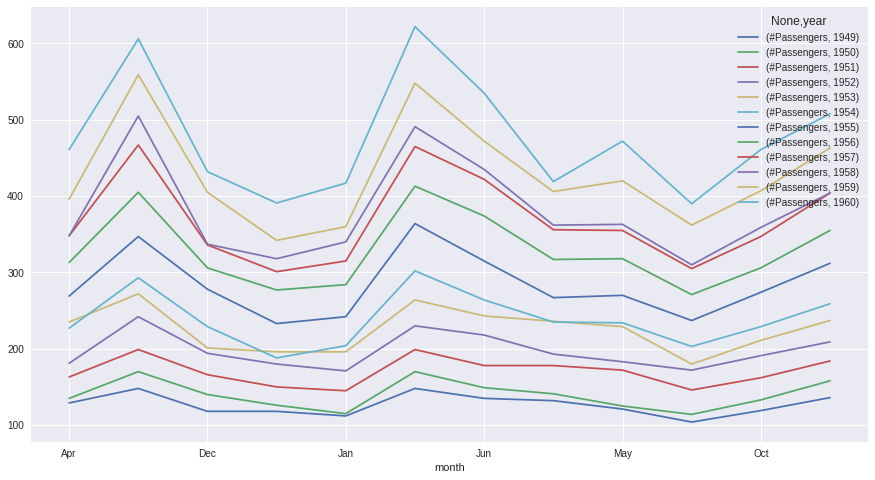

In [ ]:
# Evolución de los pasajeros por año
piv = pd.pivot_table(df ,index=['month'],columns=['year'], values=['#Passengers'])
piv.plot(figsize=(15,8))

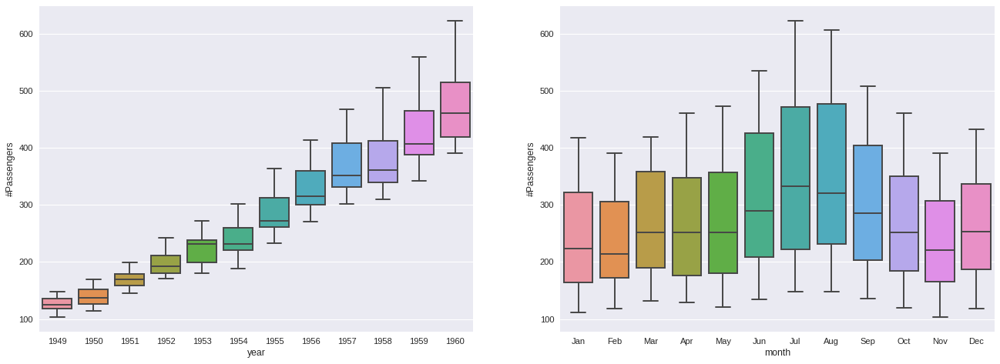

In [ ]:
# Box plot de la cantidad de pasajeros por año y por mes
fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
sn.boxplot(x='year', y='#Passengers', data=df, ax=axes[0])
sn.boxplot(x='month', y='#Passengers', data=df)

[Breve descripción de un Boxplot](https://www.pgconocimiento.com/diagrama-boxplot/)

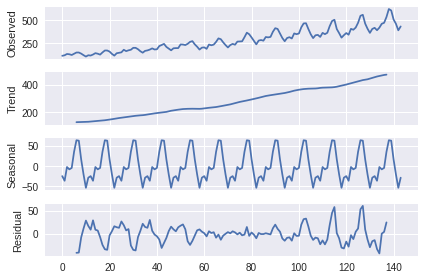

In [ ]:
# Descomposición aditiva de la serie
airpax_decompose = sm.tsa.seasonal_decompose(df['#Passengers'], model="additive", freq=12)
airpax_decompose.plot()
plt.show()

**Chequeo de Estacionariedad:**

Se dice que una serie temporal es estacionaria si lo siguiente es cierto:

1.   Media constante
2.   Varianza constante
3.   Autocovarianza que no depende del tiempo.

Pero, ¿por qué deberíamos preocuparnos por la estacionariedad? La mayoría de los métodos estadísticos utilizados en el análisis de series de tiempo asumen que la serie es estacionaria. Además, tener una serie estacionaria tiene una ventaja práctica ya que significaría que el comportamiento promedio de la serie será el mismo en el futuro. Por lo tanto, podemos hacer predicciones. Se corroborará la estacionariedad:

In [ ]:
# Test de Dickey-Fuller
def test_stationarity(timeseries):
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
test_stationarity(ts)

Results of Dickey-Fuller Test:
Test Statistic                   0.815369
p-value                          0.991880
#Lags Used                      13.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


La serie no es estacionaria porque:

*   El p-value es mayor que el nivel de confianza típico de 0.05, por lo que no rechazamos la hipótesis nula (existe una raíz unitaria).
*   Los valores críticos de la prueba Dickey-Fuller son mucho más grandes que los estadísticos de la prueba.





In [ ]:
# Se define la función de autocorrelación y autocorrelación parcial
lag_acf  = acf(ts.dropna(inplace=False), nlags=20)
lag_pacf = pacf(ts.dropna(inplace=False), nlags=20, method='ols')

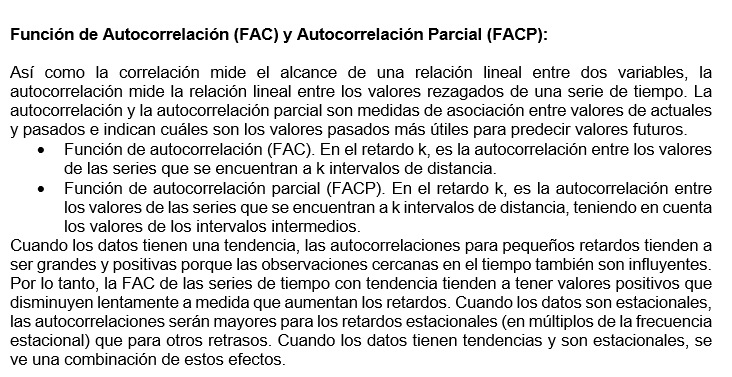

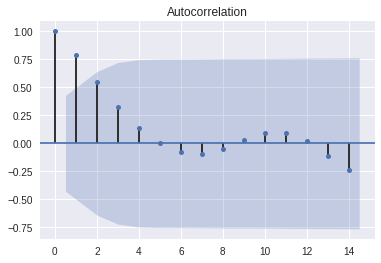

In [ ]:
# Función de autocorrelación
p=plot_acf(lag_acf)

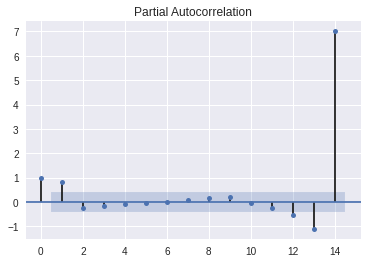

In [ ]:
# Función de autocorrelación parcial
pacf=plot_pacf(lag_acf)

Para convertir la serie temporal en estacionaria se debe eliminar la tendencia y estacionalidad. Una forma de realizar esto es mediante la diferenciación.

In [ ]:
# Equivalente del ndiffs y nsdiffs de R (ver: http://alkaline-ml.com/pmdarima/1.5.1/modules/classes.html#differencing-helpers)
print(pm.arima.ndiffs(ts))
print(pm.arima.nsdiffs(ts,m=12))

1
1


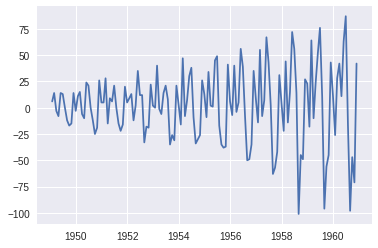

Results of Dickey-Fuller Test:
Test Statistic                  -2.829267
p-value                          0.054213
#Lags Used                      12.000000
Number of Observations Used    130.000000
Critical Value (1%)             -3.481682
Critical Value (5%)             -2.884042
Critical Value (10%)            -2.578770
dtype: float64


In [ ]:
# Se diferencia la serie 1 período
nonseasonal_diff = ts.diff(periods=1)
plt.plot(nonseasonal_diff)
plt.show()
test_stationarity(nonseasonal_diff.dropna(inplace=False))

La serie sigue siendo no estacionaria

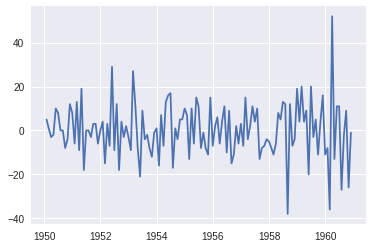

Results of Dickey-Fuller Test:
Test Statistic                -1.559562e+01
p-value                        1.856512e-28
#Lags Used                     0.000000e+00
Number of Observations Used    1.300000e+02
Critical Value (1%)           -3.481682e+00
Critical Value (5%)           -2.884042e+00
Critical Value (10%)          -2.578770e+00
dtype: float64


In [ ]:
# Se diferencia la serie 12 períodos
seasonal_diff = nonseasonal_diff.diff(periods=12)
plt.plot(seasonal_diff)
plt.show()
test_stationarity(seasonal_diff.dropna(inplace=False))

La serie es estacionaria

In [ ]:
# Se define la función de autocorrelación y autocorrelación parcial
lag_acf  = acf(seasonal_diff.dropna(inplace=False), nlags=20)
lag_pacf = pacf(seasonal_diff.dropna(inplace=False), nlags=20, method='ols')

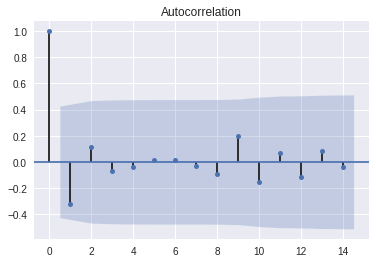

In [ ]:
# Función de autocorrelación
p=plot_acf(lag_acf)

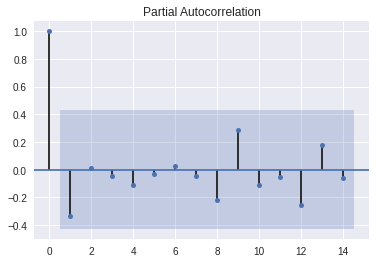

In [ ]:
# Función de autocorrelación parcial
pacf=plot_pacf(lag_acf)

<AxesSubplot:xlabel='Month'>

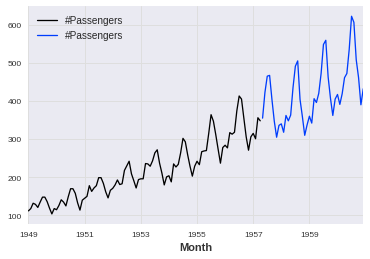

In [ ]:
# Se divide en entranamiento (70%) y testeo (30%)
train = df[:int(0.7*(len(df)))]
test = df[int(0.7*(len(df))):]

# Se grafican ambos conjuntos de datos
ax = train.plot()
test.plot(ax=ax)

## **ARIMA**
[Teoría ARIMA](https://bookdown.org/amanas/traficomadrid/m%C3%A9todos-param%C3%A9tricos.html#m%C3%A9todo-arima)

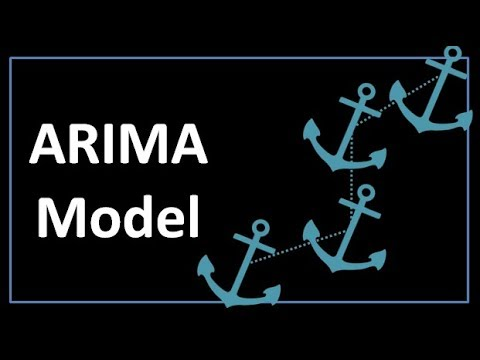

In [ ]:
YouTubeVideo('3UmyHed0iYE')
# https://www.youtube.com/watch?v=3UmyHed0iYE

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=909.769, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=907.370, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=904.979, Time=0.06 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=908.785, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=900.136, Time=0.11 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.28 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=904.858, Time=0.10 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=898.911, Time=0.09 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=903.548, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=906.025, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=896.369, Time=0.12 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=903.746, Time=0.05 se

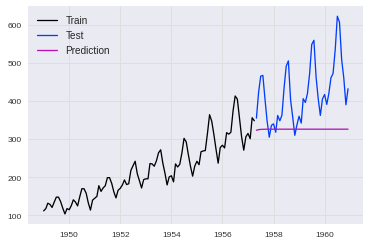

In [ ]:
# Se construye el modelo ARIMA
df = pd.read_csv('AirPassengers.csv',parse_dates = ['Month'],index_col='Month',date_parser = custom_date_parser)
train = df[:int(0.7*(len(df)))]
test = df[int(0.7*(len(df))):]

model = auto_arima(train, trace=True, error_action='ignore', suppress_warnings=True)
model.fit(train)

forecast = model.predict(n_periods=len(test))
forecast = pd.DataFrame(forecast,index = test.index,columns=['Prediction'])

# Se grafican las bases de entrenamiento, testeo y las predicciones
plt.plot(train, label='Train')
plt.plot(test, label='Test')
plt.plot(forecast, label='Prediction')
plt.legend(loc='best')
plt.show()

In [ ]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  100
Model:               SARIMAX(1, 1, 2)   Log Likelihood                -443.946
Date:                Mon, 09 Aug 2021   AIC                            895.892
Time:                        02:52:05   BIC                            906.272
Sample:                             0   HQIC                           900.092
                                - 100                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4654      0.133      3.489      0.000       0.204       0.727
ma.L1         -0.2326      0.141     -1.653      0.098      -0.508       0.043
ma.L2         -0.5172      0.099     -5.224      0.000      -0.711      -0.323
sigma2       456.8414     83.534      5.469      0.000     293.118     620.565
===================================================================================
Ljung-Box (L1) (Q):                   0.48   Jarque-Bera (JB):                 3.74
Prob(Q):                              0.49   Prob(JB):                         0.15
Heteroskedasticity (H):               3.72   Skew:                             0.31
Prob(H) (two-sided):                  0.00   Kurtosis:                         2.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test, forecast))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test, forecast)
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test, forecast)
print('Test MAE: %.3f' % mae)
r2 = r2_score(test, forecast)
print('Test R2: %.3f' % r2)

Test RMSE: 122.024
Test MSE: 14889.769
Test MAE: 97.192
Test R2: -1.548


## SARIMA
[Teoría SARIMA](https://bookdown.org/amanas/traficomadrid/m%C3%A9todos-param%C3%A9tricos.html#m%C3%A9todo-sarima---arima-estacional)

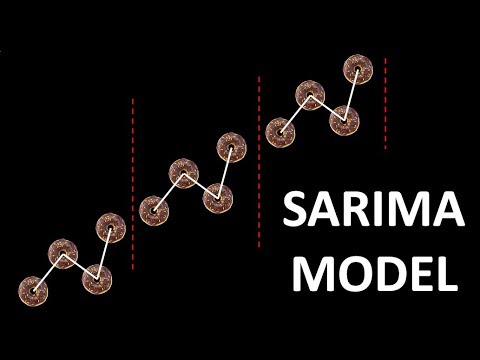

In [ ]:
YouTubeVideo('WjeGUs6mzXg')
# https://www.youtube.com/watch?v=WjeGUs6mzXg

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,1,1)[12]             : AIC=647.761, Time=0.65 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=650.796, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=644.203, Time=0.09 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=644.733, Time=0.13 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=645.995, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=646.172, Time=0.24 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=646.187, Time=0.22 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=644.600, Time=0.15 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.96 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=647.442, Time=0.06 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=646.085, Time=0.15 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=645.647, Time=0.16 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=644.346, Time=0.10 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=647.580, Time=0.25 sec
 ARIMA(1,1,0)(1,1,0)[12] intercept   

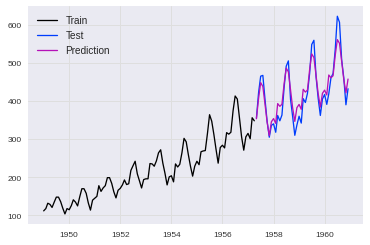

In [ ]:
# Se construye el modelo SARIMA
df = pd.read_csv('AirPassengers.csv',parse_dates = ['Month'],index_col='Month',date_parser = custom_date_parser)
train = df[:int(0.7*(len(df)))]
test = df[int(0.7*(len(df))):]

from pmdarima.arima import auto_arima
model = auto_arima(train, trace=True, error_action='ignore', suppress_warnings=True,seasonal=True,m=12,D=1) #Seasonal=True hace al modelo SARIMA
model.fit(train)

forecast = model.predict(n_periods=len(test))
forecast = pd.DataFrame(forecast,index = test.index,columns=['Prediction'])

# Se grafican las bases de entrenamiento, testeo y las predicciones
plt.plot(train, label='Train')
plt.plot(test, label='Test')
plt.plot(forecast, label='Prediction')
plt.legend(loc='best')
plt.show()

In [ ]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  100
Model:             SARIMAX(1, 1, 0)x(1, 1, 0, 12)   Log Likelihood                -319.101
Date:                            Mon, 09 Aug 2021   AIC                            644.203
Time:                                    02:51:40   BIC                            651.601
Sample:                                         0   HQIC                           647.182
                                            - 100                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2434      0.097     -2.512      0.012      -0.433      -0.054
ar.S.L12      -0.2127      0.087     -2.432      0.015      -0.384      -0.041
sigma2        89.1842     14.080      6.334      0.000      61.587     116.781
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 2.43
Prob(Q):                              0.97   Prob(JB):                         0.30
Heteroskedasticity (H):               1.32   Skew:                             0.40
Prob(H) (two-sided):                  0.46   Kurtosis:                         2.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [ ]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test, forecast))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test, forecast)
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test, forecast)
print('Test MAE: %.3f' % mae)
r2 = r2_score(test, forecast)
print('Test R2: %.3f' % r2)

Test RMSE: 26.206
Test MSE: 686.748
Test MAE: 21.539
Test R2: 0.882


## **Facebook Prophet**
[Página Oficial](https://facebook.github.io/prophet/) [Fuente del Ejemplo](https://www.kaggle.com/prashant111/tutorial-time-series-forecasting-with-prophet?scriptVersionId=50165664)

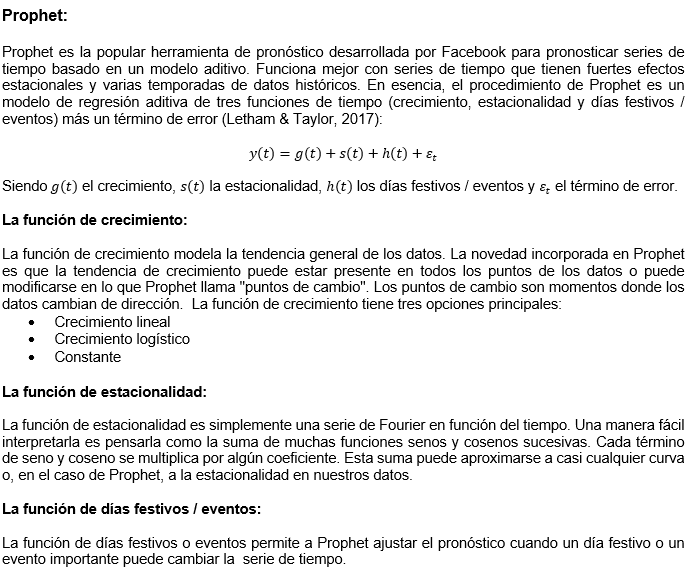

In [7]:
# Se carga la base
df = pd.read_csv('AirPassengers.csv')
df['Month'] = pd.to_datetime(df['Month'])
df.head()

,Month,#Passengers
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


La entrada a Prophet es siempre un dataframe con dos columnas: **ds** e **y**.

La columna **ds** (date stamp) debe tener el formato usado por Pandas, idealmente AAAA-MM-DD para una fecha o AAAA-MM-DD HH: MM: SS para tiempo.

La columna **y** debe ser numérica y representa la medida que deseamos pronosticar.

In [8]:
# Se redefinen las variables para poder aplicar la librería Prophet
df = df.rename({'Month':'ds','#Passengers':'y'}, axis='columns')
df.head()

,ds,y
0,1949-01-01,112
1,1949-02-01,118
2,1949-03-01,132
3,1949-04-01,129
4,1949-05-01,121


In [9]:
# Se define la base de entrenamiento (70%) y testeo (30%)
train = df[:int(0.7*(len(df)))]
test = df[int(0.7*(len(df))):]
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 100 to 143
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      44 non-null     datetime64[ns]
 1   y       44 non-null     int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 836.0 bytes


In [3]:
!pip install pystan==2.19.1.1
!pip install prophet
from fbprophet import Prophet
from fbprophet.plot import add_changepoints_to_plot

In [7]:
# Se inicializa y entrena el modelo
# Se define el intervalo de confianza en 95% (el valor por default es 80%)
m = Prophet(interval_width=0.95)
m.fit(train)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [8]:
# Se define la cantidad de períodos a predecir. 44 equivale a la base de testeo
future = m.make_future_dataframe(periods=44, freq='MS')

En el parámetro freq se define la frecuencia mensual (MS) para las predicciones

In [9]:
# Se generan las predicciones
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
139,1960-08-01,522.250585,496.418368,549.231119
140,1960-09-01,490.498907,463.452989,517.584263
141,1960-10-01,463.685036,434.870781,491.766921
142,1960-11-01,440.352424,413.067691,466.339214
143,1960-12-01,465.837361,438.488204,495.605651


*   yhat: es la predicción
*   yhat_lower: es el límite inferior de la predicción
*   yhat_upper: es el límite superior de la predicción

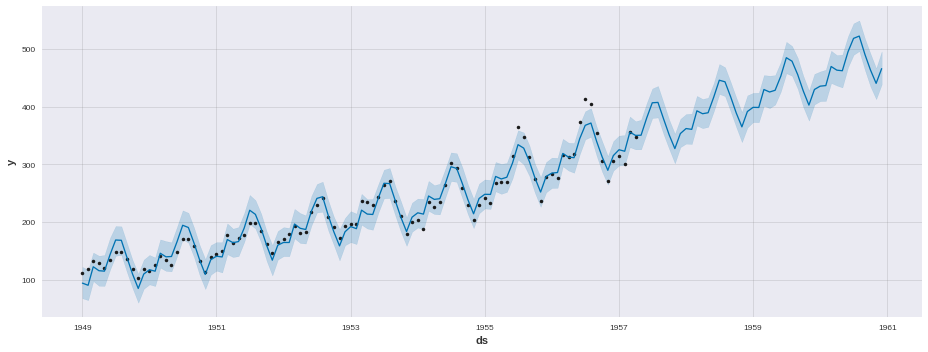

In [10]:
# Se grafican las predicciones (línea) y la base de entranamiento (puntos)
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(13)
fig = m.plot(forecast,ax=ax)
plt.show()

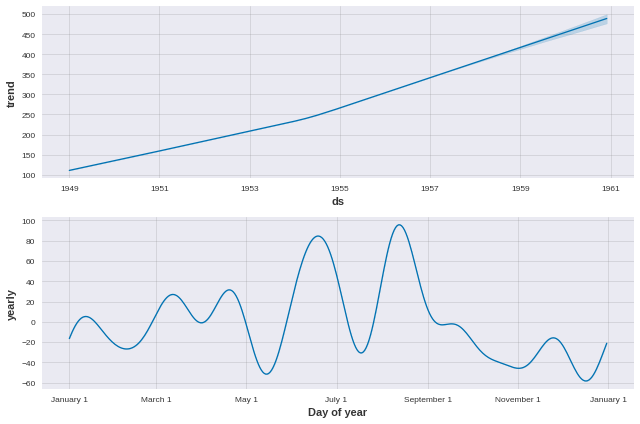

In [11]:
# Se grafican las componenestes de las predicciones
fig2 = m.plot_components(forecast)

Estos gráficos muestran que la tendencia de pasajeros es creciente con los años y que los meses de más tráfico son los de las vacaciones de Julio y Agosto

In [12]:
# Configuración para obtener gráficos interactivos
from plotly.offline import iplot, init_notebook_mode
import plotly.graph_objs as go

In [13]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [14]:
# Se generan los gráficos de las predicciones
configure_plotly_browser_state()
init_notebook_mode(connected=False)
from fbprophet.plot import plot_plotly, plot_components_plotly
plot_plotly(m, forecast)

In [15]:
# Se grafican las componentes de las predicciones
configure_plotly_browser_state()
init_notebook_mode(connected=False)
plot_components_plotly(m, forecast)

Los puntos de cambio son aquellos momentos donde la serie tiene un cambio abrupto en su trayectoria. Por default Prophet agrega 25 puntos de cambio al 80% del conjunto de datos.

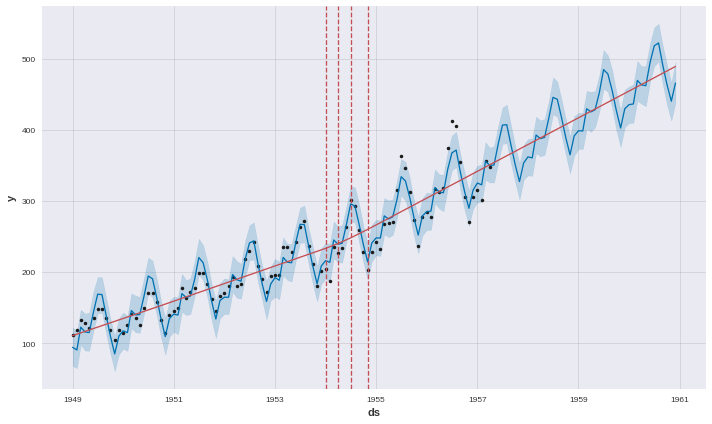

In [16]:
# Se grafican los puntos de cambio
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

In [ ]:
m.changepoints

3    1949-04-01
6    1949-07-01
9    1949-10-01
13   1950-02-01
16   1950-05-01
19   1950-08-01
22   1950-11-01
25   1951-02-01
28   1951-05-01
32   1951-09-01
35   1951-12-01
38   1952-03-01
41   1952-06-01
44   1952-09-01
47   1952-12-01
51   1953-04-01
54   1953-07-01
57   1953-10-01
60   1954-01-01
63   1954-04-01
66   1954-07-01
70   1954-11-01
73   1955-02-01
76   1955-05-01
79   1955-08-01
Name: ds, dtype: datetime64[ns]

In [ ]:
# Se generan las predicciones para la base de testeo
X_tst_forecast = m.predict(test)
X_tst_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
39,1960-08-01,522.250585,495.953648,549.029059
40,1960-09-01,490.498907,462.187916,519.041072
41,1960-10-01,463.685036,436.839184,492.305657
42,1960-11-01,440.352424,412.741970,468.579505
43,1960-12-01,465.837361,437.954051,491.474392


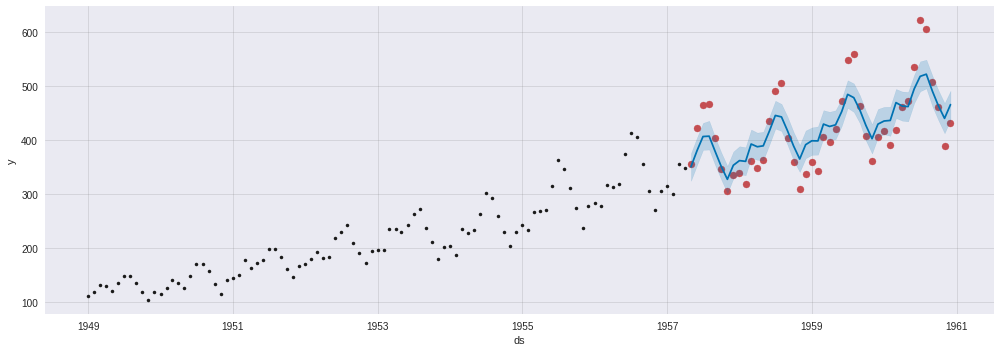

In [ ]:
# Se grafican la base de entrenamiento (punteado negro), la de testeo (punteado rojo) y las predicciones (azul)
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(14)
ax.scatter(test.ds, test['y'], color='r')
fig = m.plot(X_tst_forecast, ax=ax)

In [ ]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test['y'], X_tst_forecast['yhat']))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test['y'], X_tst_forecast['yhat'])
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test['y'], X_tst_forecast['yhat'])
print('Test MAE: %.3f' % mae)
r2 = r2_score(test['y'], X_tst_forecast['yhat'])
print('Test R2: %.3f' % r2)

Test RMSE: 41.877
Test MSE: 1753.723
Test MAE: 35.095
Test R2: 0.700


## **Neural Prophet**
[Página Oficial](https://neuralprophet.com/) [Prophet vs Neural Prophet](https://towardsdatascience.com/facebooks-prophet-deep-learning-neuralprophet-76796aed1d86)

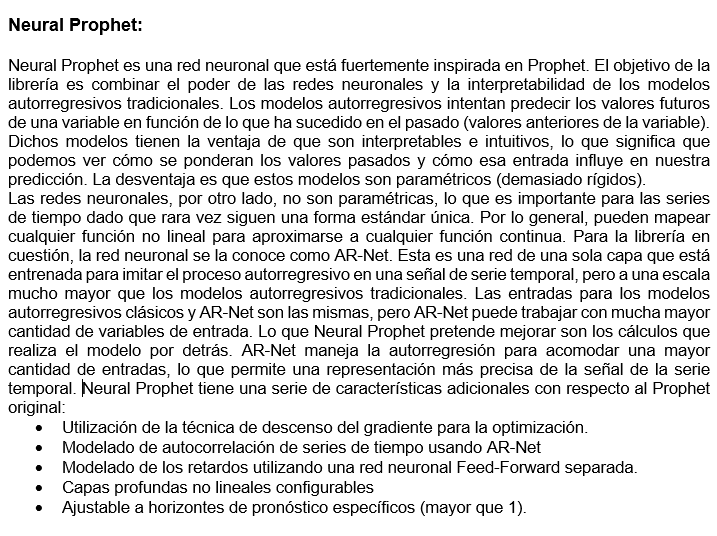

In [ ]:
# Se inicializa y entrena el modelo
m = NeuralProphet()
metrics = m.fit(train, freq="MS")

INFO: nprophet.utils - set_auto_seasonalities: Disabling weekly seasonality. Run NeuralProphet with weekly_seasonality=True to override this.
INFO: nprophet.utils - set_auto_seasonalities: Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO: nprophet.config - set_auto_batch_epoch: Auto-set batch_size to 8
INFO: nprophet.config - set_auto_batch_epoch: Auto-set epochs to 320


  0%|          | 0/100 [00:00<?, ?it/s]

INFO: nprophet - _lr_range_test: learning rate range test found optimal lr: 4.33E-01
Epoch[320/320]: 100%|██████████| 320/320 [00:07<00:00, 42.30it/s, SmoothL1Loss=0.00111, MAE=9.53, RegLoss=0]


In [ ]:
# Se generan las predicciones
future = m.make_future_dataframe(train, periods=44)
forecast = m.predict(future)

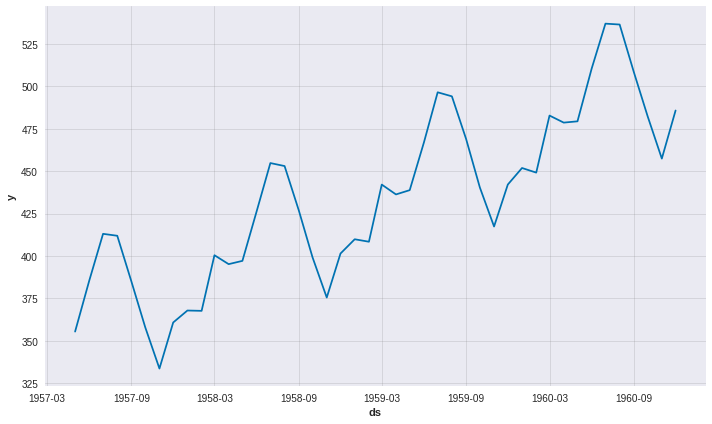

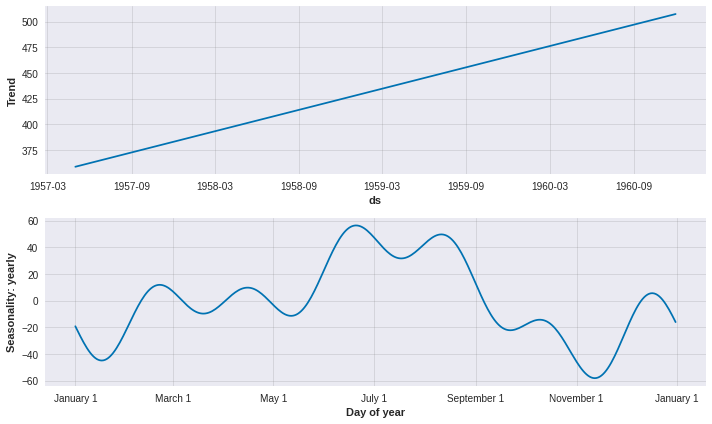

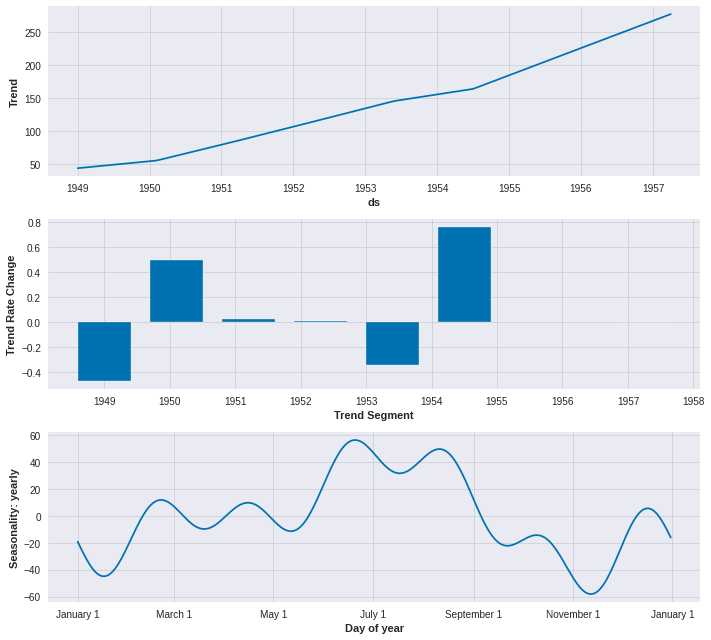

In [ ]:
# Se grafican las predicciones y las componentes
fig_forecast = m.plot(forecast)
fig_components = m.plot_components(forecast)
fig_model = m.plot_parameters()

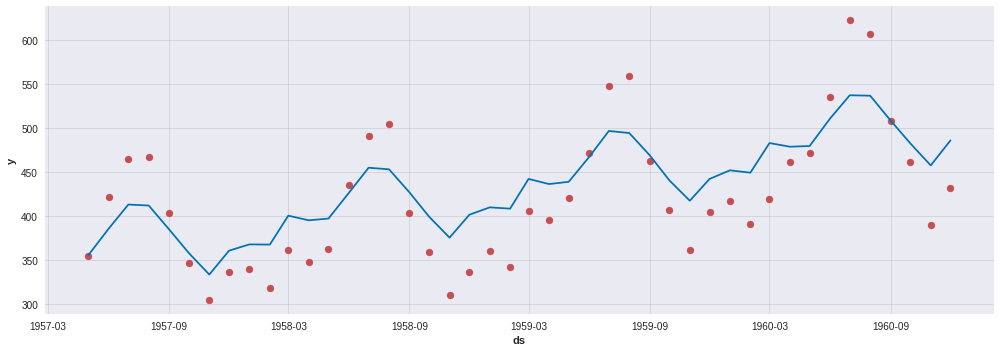

In [ ]:
# Se grafican las predicciones (línea) y la base de testeo (rojo)
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(14)
ax.scatter(test.ds, test['y'], color='r')
fig = m.plot(forecast, ax=ax)

In [ ]:
# Predicciones
forecast

,ds,y,yhat1,residual1,trend,season_yearly
0,1957-05-01,None,355.447449,NaN,358.716888,-3.269465
1,1957-06-01,None,385.607361,NaN,362.233002,23.374380
2,1957-07-01,None,413.096954,NaN,365.635651,47.461292
3,1957-08-01,None,411.956604,NaN,369.151794,42.804802
4,1957-09-01,None,384.837616,NaN,372.667877,12.169735
5,1957-10-01,None,357.996429,NaN,376.070526,-18.074070
6,1957-11-01,None,333.636597,NaN,379.586609,-45.950008
7,1957-12-01,None,360.803650,NaN,382.989319,-22.185669
8,1958-01-01,None,367.868561,NaN,386.505402,-18.636864
9,1958-02-01,None,367.673065,NaN,390.021515,-22.348431


In [ ]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test['y'], forecast['yhat1']))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test['y'], forecast['yhat1'])
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test['y'], forecast['yhat1'])
print('Test MAE: %.3f' % mae)
r2 = r2_score(test['y'], forecast['yhat1'])
print('Test R2: %.3f' % r2)

Test RMSE: 43.703
Test MSE: 1909.919
Test MAE: 38.269
Test R2: 0.673


## **Librería DARTS**
[Página Oficial](https://unit8co.github.io/darts/) [Fuente del Ejemplo](https://medium.com/unit8-machine-learning-publication/darts-time-series-made-easy-in-python-5ac2947a8878)

### **Exponential Smoothing**

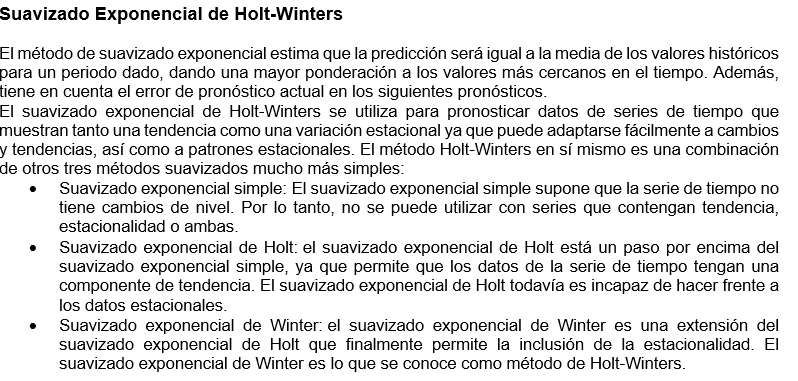

In [31]:
! pip install u8darts

     |████████████████████████████████| 235 kB 6.8 MB/s 


In [11]:
# Se genera la base de entrenamiento, testeo y la base completa
train2 = TimeSeries.from_dataframe(train, 'ds', 'y')
test2 = TimeSeries.from_dataframe(test, 'ds', 'y')
df2 = TimeSeries.from_dataframe(df, 'ds', 'y')

In [12]:
# Se inicializa, se entrena el modelo y se generan las predicciones
model = ExponentialSmoothing()
model.fit(train2)
prediction = model.predict(44)

In [14]:
# Previsualización de las predicciones
prediction

<TimeSeries (DataArray) (time: 44, component: 1, sample: 1)>
array([[[351.2392091 ]],

       [[403.30781681]],

       [[439.93650523]],

       [[426.79954752]],

       [[375.97260245]],

       [[329.10891584]],

       [[295.90025708]],

       [[333.33058749]],

       [[343.40446209]],

       [[331.80827407]],

...

       [[440.25518341]],

       [[430.08389565]],

       [[434.94066934]],

       [[487.00927706]],

       [[523.63796547]],

       [[510.50100776]],

       [[459.67406269]],

       [[412.81037608]],

       [[379.60171733]],

       [[417.03204773]]])
Coordinates:
  * time       (time) datetime64[ns] 1957-05-01 1957-06-01 ... 1960-12-01
  * component  (component) object 'y'
Dimensions without coordinates: sample

In [ ]:
# Previsualización de la base de testeo
test2

              y
ds             
1957-05-01  355
1957-06-01  422
1957-07-01  465
1957-08-01  467
1957-09-01  404
1957-10-01  347
1957-11-01  305
1957-12-01  336
1958-01-01  340
1958-02-01  318
1958-03-01  362
1958-04-01  348
1958-05-01  363
1958-06-01  435
1958-07-01  491
1958-08-01  505
1958-09-01  404
1958-10-01  359
1958-11-01  310
1958-12-01  337
1959-01-01  360
1959-02-01  342
1959-03-01  406
1959-04-01  396
1959-05-01  420
1959-06-01  472
1959-07-01  548
1959-08-01  559
1959-09-01  463
1959-10-01  407
1959-11-01  362
1959-12-01  405
1960-01-01  417
1960-02-01  391
1960-03-01  419
1960-04-01  461
1960-05-01  472
1960-06-01  535
1960-07-01  622
1960-08-01  606
1960-09-01  508
1960-10-01  461
1960-11-01  390
1960-12-01  432
Freq: MS

Text(0.5, 0, 'Year')

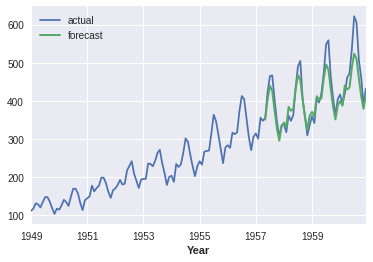

In [ ]:
# Se grafican la base completa y las predicciones
df2.plot(label='actual')
prediction.plot(label='forecast', lw=2)
plt.legend()
plt.xlabel('Year')

In [ ]:
# calculate RMSE
rmse = sqrt(mean_squared_error(test['y'], prediction.pd_dataframe()))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test['y'], prediction.pd_dataframe())
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test['y'], prediction.pd_dataframe())
print('Test MAE: %.3f' % mae)
r2 = r2_score(test['y'], prediction.pd_dataframe())
print('Test R2: %.3f' % r2)

Test RMSE: 33.629
Test MSE: 1130.911
Test MAE: 24.876
Test R2: 0.806


### **AutoARIMA**

In [ ]:
# Se inicializa, se entrena el modelo y se generan las predicciones
model_aarima = AutoARIMA(random_state = 10)
model_aarima.fit(train2)
prediction = model_aarima.predict(44)

In [ ]:
# Previsualización de las predicciones
prediction

                     0
1957-05-01  323.394872
1957-06-01  324.807429
1957-07-01  325.464901
1957-08-01  325.770920
1957-09-01  325.913356
1957-10-01  325.979652
1957-11-01  326.010510
1957-12-01  326.024872
1958-01-01  326.031557
1958-02-01  326.034669
1958-03-01  326.036117
1958-04-01  326.036791
1958-05-01  326.037105
1958-06-01  326.037251
1958-07-01  326.037319
1958-08-01  326.037351
1958-09-01  326.037365
1958-10-01  326.037372
1958-11-01  326.037376
1958-12-01  326.037377
1959-01-01  326.037378
1959-02-01  326.037378
1959-03-01  326.037378
1959-04-01  326.037378
1959-05-01  326.037378
1959-06-01  326.037378
1959-07-01  326.037378
1959-08-01  326.037378
1959-09-01  326.037378
1959-10-01  326.037378
1959-11-01  326.037378
1959-12-01  326.037378
1960-01-01  326.037378
1960-02-01  326.037378
1960-03-01  326.037378
1960-04-01  326.037378
1960-05-01  326.037378
1960-06-01  326.037378
1960-07-01  326.037378
1960-08-01  326.037378
1960-09-01  326.037378
1960-10-01  326.037378
1960-11-01 

Text(0.5, 0, 'Year')

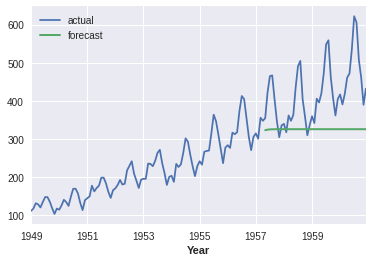

In [ ]:
# Se grafican la base completa y las predicciones
df2.plot(label='actual')
prediction.plot(label='forecast', lw=2)
plt.legend()
plt.xlabel('Year')

In [ ]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test['y'], prediction.pd_dataframe()))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test['y'], prediction.pd_dataframe())
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test['y'], prediction.pd_dataframe())
print('Test MAE: %.3f' % mae)
r2 = r2_score(test['y'], prediction.pd_dataframe())
print('Test R2: %.3f' % r2)

Test RMSE: 122.024
Test MSE: 14889.769
Test MAE: 97.192
Test R2: -1.548


### **RNN (LSTM)**

In [17]:
# Se normaliza la base
from darts.dataprocessing.transformers import Scaler
transformer = Scaler()
train_transformed = transformer.fit_transform(train2)
test_transformed = transformer.transform(test2)
series_transformed = transformer.transform(df2)

In [26]:
# Se inicializa, se entrena el modelo y se generan las predicciones
model_RNN = RNNModel( model='LSTM',
    input_chunk_length=12,
    output_chunk_length=1,
    hidden_dim=25,
    n_rnn_layers=1,
    dropout=0.4,
    batch_size=16,
    n_epochs=100,
    optimizer_kwargs={'lr': 1e-3},
    log_tensorboard=True,
    random_state=42)
model_RNN.fit(train_transformed)

In [ ]:
prediction = model_RNN.predict(44)
# Por algún motivo esta parte del código me está fallando. Antes funcionaba bien, quizás actualizaron algo de la librería
# Les dejo un ejemplo completo de RNN con Darts:
# https://github.com/unit8co/darts/blob/master/examples/05-RNN-examples.ipynb

Text(0.5, 0, 'Year')

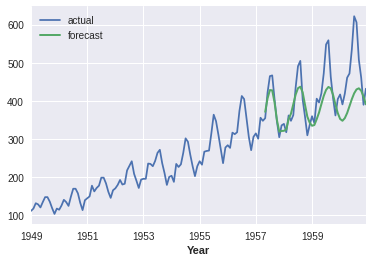

In [ ]:
# Se grafican la base completa y las predicciones
transformer.inverse_transform(series_transformed).plot(label='actual')
transformer.inverse_transform(prediction).plot(label='forecast', lw=2)
plt.legend()
plt.xlabel('Year')

In [ ]:
# Previsualización de las predicciones
transformer.inverse_transform(prediction)

                     0
1957-05-01  371.565582
1957-06-01  406.528290
1957-07-01  428.558136
1957-08-01  427.723267
1957-09-01  396.067871
1957-10-01  350.162384
1957-11-01  319.547180
1957-12-01  321.378265
1958-01-01  321.759430
1958-02-01  325.246002
1958-03-01  352.392151
1958-04-01  366.663361
1958-05-01  391.253967
1958-06-01  416.554565
1958-07-01  433.431000
1958-08-01  437.358063
1958-09-01  422.612213
1958-10-01  389.947113
1958-11-01  358.731750
1958-12-01  343.238007
1959-01-01  335.037689
1959-02-01  336.933258
1959-03-01  352.402527
1959-04-01  369.740112
1959-05-01  391.881592
1959-06-01  413.165894
1959-07-01  429.018860
1959-08-01  436.703156
1959-09-01  433.105072
1959-10-01  415.767670
1959-11-01  390.472656
1959-12-01  368.215729
1960-01-01  352.815765
1960-02-01  348.148956
1960-03-01  354.941528
1960-04-01  368.355164
1960-05-01  386.365051
1960-06-01  404.714569
1960-07-01  420.071838
1960-08-01  430.217651
1960-09-01  433.151520
1960-10-01  426.835114
1960-11-01 

In [ ]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test['y'], prediction.pd_dataframe()))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test['y'], prediction.pd_dataframe())
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test['y'], prediction.pd_dataframe())
print('Test MAE: %.3f' % mae)
r2 = r2_score(test['y'], prediction.pd_dataframe())
print('Test R2: %.3f' % r2)

Test RMSE: 427.037
Test MSE: 182360.977
Test MAE: 420.156
Test R2: -30.204


### **FFT (Fast Fourier Transform)**
[Artículo sobre la Transformada de Fourier](https://medium.com/@khairulomar/deconstructing-time-series-using-fourier-transform-e52dd535a44e)

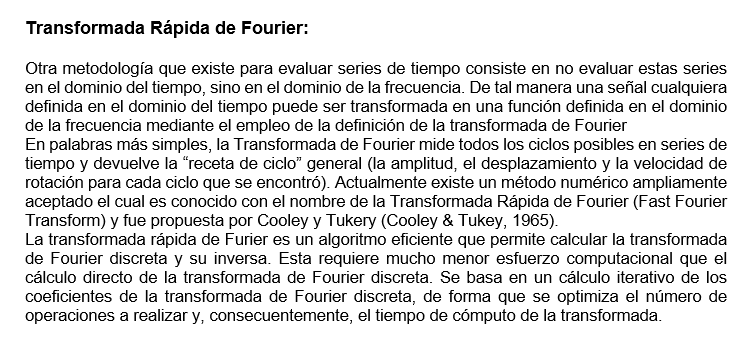

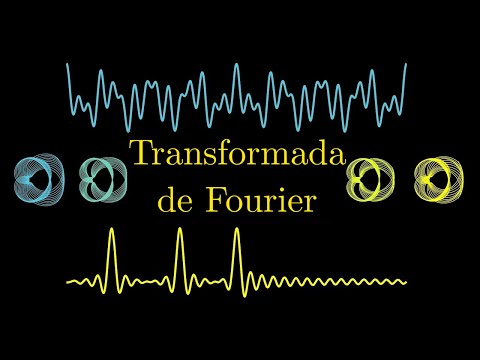

In [ ]:
YouTubeVideo('h4PTucW3Rm0')
# https://www.youtube.com/watch?v=h4PTucW3Rm0

In [ ]:
# Se inicializa, se entrena el modelo y se generan las predicciones
model_FFT = FFT()
model_FFT.fit(train2)
prediction = model_FFT.predict(44)

In [ ]:
# Previsualización de las predicciones
prediction

                     0
1957-05-01  229.988275
1957-06-01  209.842457
1957-07-01  189.327510
1957-08-01  170.863561
1957-09-01  156.316058
1957-10-01  146.444357
1957-11-01  140.722048
1957-12-01  137.584149
1958-01-01  135.014884
1958-02-01  131.277297
1958-03-01  125.539082
1958-04-01  118.183060
1958-05-01  110.694720
1958-06-01  105.159538
1958-07-01  103.533475
1958-08-01  106.928443
1958-09-01  115.154176
1958-10-01  126.678057
1958-11-01  139.029901
1958-12-01  149.532549
1959-01-01  156.128702
1959-02-01  158.036441
1959-03-01  156.014031
1959-04-01  152.135227
1959-05-01  149.132059
1959-06-01  149.503545
1959-07-01  154.670259
1959-08-01  164.448548
1959-09-01  177.024334
1959-10-01  189.452549
1959-11-01  198.541864
1959-12-01  201.857782
1960-01-01  198.531478
1960-02-01  189.613323
1960-03-01  177.844841
1960-04-01  166.900797
1960-05-01  160.319412
1960-06-01  160.441288
1960-07-01  167.683217
1960-08-01  180.377819
1960-09-01  195.241409
1960-10-01  208.341164
1960-11-01 

Text(0.5, 0, 'Year')

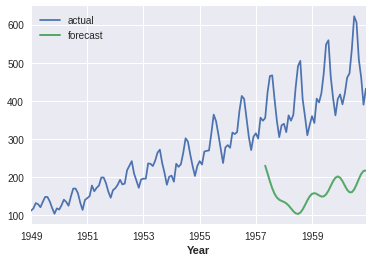

In [ ]:
# Se grafican la base completa y las predicciones
df2.plot(label='actual')
prediction.plot(label='forecast', lw=2)
plt.legend()
plt.xlabel('Year')

In [ ]:
# Cálculo de las medidas de precisión
rmse = sqrt(mean_squared_error(test['y'], prediction.pd_dataframe()))
print('Test RMSE: %.3f' % rmse)
mse = mean_squared_error(test['y'], prediction.pd_dataframe())
print('Test MSE: %.3f' % mse)
mae = mean_absolute_error(test['y'], prediction.pd_dataframe())
print('Test MAE: %.3f' % mae)
r2 = r2_score(test['y'], prediction.pd_dataframe())
print('Test R2: %.3f' % r2)

Test RMSE: 271.310
Test MSE: 73609.224
Test MAE: 259.851
Test R2: -11.596


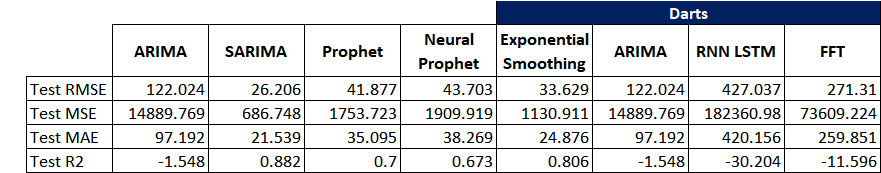